<center> <img src="https://d3i71xaburhd42.cloudfront.net/261c3e30bae8b8bdc83541ffa9331b52fcf015e6/3-Figure2-1.png" width=50% > </center>

<br><br>

<center> 
    <font size="6">Lab 1: Colour, Intrinsic Image Decomposition & Photometric Stereo</font> 
</center>
<center> 
    <font size="4">Computer Vision 1 University of Amsterdam</font> 
</center>
<center> 
    <font size="4">Due 23:59, September 13, 2024 (Amsterdam time)</font> 
</center>
<center> 
    <font size="4"><b>TA's: Xiaoyan, Floris, Adrian</b></font>
</center>

<br><br>

***

<br><br>

<center>

Student1 ID: 13710281 \
Student1 Name: Daniel Amidirad

Student2 ID: 16016327 \
Student2 Name: Daniel Otero

Student3 ID: 16427556 \
Student3 Name: Miguel Mendes

( Student4 ID: \
Student4 Name: )

</center>

### **Import Libraries**

In [1]:
import sys

if sys.version_info[0] < 3:
    raise Exception("Python 3 or a more recent version is required.")

In [2]:
# environment and libraries
import os
import glob
import numpy as np
import random
import cv2
import matplotlib
import matplotlib.pyplot as plt

import warnings
warnings.simplefilter(action = "ignore", category = RuntimeWarning)
warnings.simplefilter(action = "ignore", category = UserWarning)

from mpl_toolkits.mplot3d import Axes3D

In [3]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "4.10.0", "You're not using the provided Python environment!"
assert np.__version__ == "1.26.4", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.9.2", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

### **Instructions**

Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 1 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to **use the Python environment provided** with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the Python cell above you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```conda env create --file=cv1_environment.yaml```, then activate the environment using the command ```conda activate cv1```.
- Do not use additional packages or materials that have not been provided or explicitly mentioned.
- Please express your thoughts **concisely**. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a **brief** description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.

Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

### **Overview**

- [Section 1: Colour Spaces (13 points)](#section-1)
  - [Question 1 (2 points)](#question-1)
  - [Question 2 (6 points)](#question-2)
  - [Question 3 (2 points)](#question-3)
  - [Question 4 (2 points)](#question-4)
  - [Question 5 (1 point)](#question-5)
- [Section 2: Colour Constancy (13 points)](#section-2)
  - [Question 6 (8 points)](#question-6)
  - [Question 7 (2 points)](#question-7)
  - [Question 8 (3 points)](#question-8)
- [Section 3: Intrinsic Image Decomposition (14 points)](#section-3)
  - [Question 9 (2 points)](#question-9)
  - [Question 10 (2 points)](#question-10)
  - [Question 11 (4 points)](#question-11)
  - [Question 12 (2 points)](#question-12)
  - [Question 13 (2 points)](#question-13)
  - [Question 14 (2 points)](#question-14)
- [Section 4: Photometric Stereo (60 points)](#section-4)
  - [Question 15 (4 points)](#question-15)
  - [Question 16 (2 points)](#question-16)
  - [Question 17 (1 point)](#question-17)
  - [Question 18 (2 points)](#question-18)
  - [Question 19 (2 points)](#question-19)
  - [Question 20 (5 points)](#question-20)
  - [Question 21 (3 points)](#question-21)
  - [Question 22 (6 points)](#question-22)
  - [Question 23 (2 points)](#question-23)
  - [Question 24 (2 points)](#question-24)
  - [Question 25 (3 points)](#question-25)
  - [Question 26 (2 points)](#question-26)
  - [Question 27 (2 points)](#question-27)
  - [Question 28 (5 points)](#question-28)
  - [Question 29 (2 points)](#question-29)
  - [Question 30 (2 points)](#question-30)
  - [Question 31 (4 points)](#question-31)
  - [Question 32 (1 point)](#question-32)
  - [Question 33 (2 points)](#question-33)
  - [Question 34 (2 points)](#question-34)
  - [Question 35 (1 point)](#question-35)
  - [Question 36 (4 points)](#question-36)
  - [Question 37 (1 point)](#question-37)
- [Section X: Individual Contribution Report (Mandatory)](#section-x)

<a id="section-1"></a>
### **Section 1: Colour Spaces**

In this part of the assignment, you will study the different colour spaces for image representations and experiment how to convert a given RGB image to a specific colour space

<a id="question-1"></a>
#### <font color='#FF0000'>Question 1 (2 points)</font>

Why do we use the RGB color model as the basis for our digital cameras and photography? How does a standard digital camera capture a full RGB color image?

##### <font color='yellow'>Answer:</font>

> Red, green and blue light can combine in different proportions to form most of the visible spectrum of color. A light-sensitive sensor records the intensity of light falling onto it. A Bayer filter array, composed of red, green, and blue filters, is placed over the sensor to capture color.

<a id="question-2"></a>
#### <font color='#FF0000'>Question 2 (6 points)</font>

Create a function to convert an RGB image into various color spaces using the provided `convert_colour_space()` function and other sub-functions.

**Color Spaces to Convert:**

1. **Grayscale**

   Convert the RGB image into grayscale using 3 different methods mentioned in [John D. Cook's blog](https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/). Additionally, check and report which method OpenCV uses for grayscale conversion, include it as well, and visualize all 4 methods in the same figure.

2. **Opponent Color Space**

   $\begin{pmatrix}
   O_1 \\
   O_2 \\
   O_3
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R-G}{\sqrt{2}} \\
   \frac{R+G-2B}{\sqrt{6}} \\
   \frac{R+G+B}{\sqrt{3}}
   \end{pmatrix}$

3. **Normalized RGB (rgb) Color Space**

   $\begin{pmatrix}
   r \\
   g \\
   b
   \end{pmatrix}$ = $\begin{pmatrix}
   \frac{R}{R+G+B} \\
   \frac{G}{R+G+B} \\
   \frac{B}{R+G+B}
   \end{pmatrix}$

4. **HSV Color Space**

   Convert the RGB image into HSV Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2HSV)*.

5. **YCbCr Color Space**

   Convert the RGB image into YCbCr Color Space using OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2YCrCb)*. Arrange the channels in $Y, C_b,$ and $C_r$ order.

**Note:** 

- Ensure you understand the data types and ranges required by the Python conversion and image displaying functions. This usually means [0, 1] for float datatype or [0, 255] for integer datatype. Explicitly change the datatype if necessary.

- Each color space may have its own visualization requirements. For instance, think about how to meaningfully visualize the H, S, and V channels. Ensure each channel is visualized in an RGB manner where applicable.

**Extra:** It might be interesting to visualize the image in its original color space (RGB) as well.

In [4]:
def convert_rgb_to_grays(input_image):
    '''
    Converts an RGB image into grayscale using different methods and 
    returns the grayscale images stacked as separate channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing different grayscale conversion methods
    '''

    # convert input image to array format if not already
    img = np.array(input_image)
    img = img.astype(np.float32) / 255.0

    R = img[..., 0]
    G = img[..., 1]
    B = img[..., 2]

    # lightness method
    lightness = (np.maximum(np.maximum(R, G), B) + np.minimum(np.minimum(R, G), B)) / 2.0

    # average method
    average = (R + G + B) / 3.0

    # luminosity method
    luminosity = 0.21 * R + 0.72 * G + 0.07 * B

    # built-in OpenCV function
    opencv = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # stack the results to easily visualize the 4 different methods
    new_image = np.stack([lightness, average, luminosity, opencv], axis=-1)

    return new_image

In [5]:
def convert_rgb_to_opponent(input_image):
    '''
    Converts an RGB image into the opponent color space and 
    returns the image with opponent color channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing opponent color space
    '''
    # convert input image to array format if not already
    img = np.array(input_image)
    img = img.astype(np.float32) / 255.0

    R = img[..., 0] 
    G = img[..., 1]
    B = img[..., 2]

    O1 = (R - G) / np.sqrt(2)
    O2 = (R + G - 2 * B) / np.sqrt(6)
    O3 = (R + G + B) / np.sqrt(3)
    
    new_image = np.stack([O1, O2, O3], axis=-1)
    return new_image

In [6]:
def convert_rgb_to_normedrgb(input_image):
    '''
    Converts an RGB image into the normalized RGB (nrgb) color space and 
    returns the image with normalized RGB channels.

    Args:
        input_image: RGB image

    Returns:
        new_image: image with channels representing normalized RGB color space
    '''

    # convert input image to array format if not already
    img = np.array(input_image)
    img = img.astype(np.float32) / 255.0

    R = img[..., 0] 
    G = img[..., 1]
    B = img[..., 2]
    
    r = R / (R + G + B)
    g = G / (R + G + B)
    b = B / (R + G + B)

    new_image = np.stack([r, g, b], axis=-1)
    return new_image

In [7]:
def convert_colour_space(input_image, colourspace):
    '''
    Converts an RGB image into a specified color space and 
    returns the image in its new color space.

    Args:
        input_image: RGB image
        colourspace: colour space to be converted to. 
        - choices: opponent, nrgb, hsv, ycbcr, grays

    Returns:
        new_image: image with channels in provided colour space
    '''

    # Convert the image into double precision for conversions
    input_image = input_image.astype(np.float32)

    if colourspace.lower() == 'opponent':
        new_image = convert_rgb_to_opponent(input_image)

    elif colourspace.lower() == 'nrgb':
        new_image = convert_rgb_to_normedrgb(input_image)

    elif colourspace.lower() == 'hsv':
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2HSV)

    elif colourspace.lower() == 'ycbcr':
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2YCrCb)
        new_image = new_image[..., [0, 2, 1]]

    elif colourspace.lower() == 'grays':
        new_image = convert_rgb_to_grays(input_image)

    else:
        raise NotImplementedError('Unknown colorspace type [%s]...' % colourspace)

    return new_image

<a id="question-3"></a>
#### <font color='#FF0000'>Question 3 (2 points)</font>

Visualize the image in each new color space and its individual channels separately within the same figure. For example, for the HSV color space, visualize the converted HSV image and its Hue, Saturation, and Value channels separately (4 images in 1 figure). Ensure that the channel visualizations are **meaningful**.

The function `visualize_colourspace` below needs to be completed.

In [8]:
def visualize_colourspace(image, colourspace='rgb'):
    """
    Visualize the image in its corresponding colour space.
    This function visualizes 1 figure with 4 images.
    Hint: some RGB representation of the new colour space image + each of its channels

    Args:
        image: image with channels of some colour space
        colourspace: colour space to be converted to.
        - choices: opponent, nrgb, hsv, ycbcr, grays
    """
    
    fig, axs = plt.subplots(1, 4, figsize=(12, 4))
    axs = axs.ravel()

    if colourspace == "opponent":
        opponent_img = convert_colour_space(image, colourspace)
        o1 = cv2.normalize(opponent_img[...,0], None, 0, 1, cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        o2 = cv2.normalize(opponent_img[...,1], None, 0, 1, cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        o3 = cv2.normalize(opponent_img[...,2], None, 0, 1, cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        stack = np.dstack([o1, o2, o3])

        fig.suptitle("Opponent Space")
        axs[0].imshow(stack)
        axs[0].set_title("RGB Representation")
        axs[0].axis("off")

        for i, lbl in enumerate(["O1","O2","O3"]):
            axs[i+1].imshow([o1,o2,o3][i], cmap='gray')
            axs[i+1].set_title(lbl)
            axs[i+1].axis('off')

    elif colourspace in ['rgb', 'nrgb']:
        converted_img = convert_colour_space(image, colourspace) if colourspace=='nrgb' else image.astype(np.float32)/255.0
        fig.suptitle("Normalized RGB" if colourspace=='nrgb' else "RGB")
        axs[0].imshow(converted_img)
        axs[0].set_title("RGB Representation")
        axs[0].axis('off')

        for i, lbl in enumerate(['R','G','B']):
            black_img = np.zeros_like(converted_img)

            selected_ch = black_img.copy()
            selected_ch[..., i] = converted_img[..., i]
            
            axs[i+1].imshow(selected_ch)
            axs[i+1].set_title(lbl)
            axs[i+1].axis('off')

    elif colourspace == 'hsv':
        converted_img = convert_colour_space(image, 'hsv')
        h = cv2.normalize(converted_img[...,0], None, 0, 1, cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        s = cv2.normalize(converted_img[...,1], None, 0, 1, cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        v = cv2.normalize(converted_img[...,2], None, 0, 1, cv2.NORM_MINMAX, dtype=cv2.CV_32F)
        hsv_norm = np.dstack([h,s,v])

        fig.suptitle("HSV")
        axs[0].imshow(hsv_norm)
        axs[0].set_title("RGB Representation")
        axs[0].axis('off')

        hue_color = cv2.applyColorMap((h*255).astype(np.uint8), cv2.COLORMAP_HSV)
        axs[1].imshow(hue_color)
        axs[1].set_title("Hue")
        axs[1].axis('off')

        axs[2].imshow(s, cmap='gray')
        axs[2].set_title("Saturation")
        axs[2].axis('off')

        axs[3].imshow(v, cmap='gray')
        axs[3].set_title("Value")
        axs[3].axis('off')

    elif colourspace == 'ycbcr':
        converted_img = convert_colour_space(image, 'ycbcr').astype(np.uint8) 

        Y = converted_img[..., 0]
        Cb = converted_img[..., 1]
        Cr = converted_img[..., 2]

        rgb_display = cv2.cvtColor(converted_img, cv2.COLOR_YCrCb2RGB)

        Y_disp = cv2.normalize(Y, None, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

        neutral = np.full_like(Y, 128, dtype=np.uint8)
        Cb_rgb = cv2.cvtColor(cv2.merge([neutral, neutral, Cb]), cv2.COLOR_YCrCb2RGB)
        Cr_rgb = cv2.cvtColor(cv2.merge([neutral, Cr, neutral]), cv2.COLOR_YCrCb2RGB)

        fig.suptitle("YCbCr")
        axs[0].imshow(rgb_display)
        axs[0].set_title("RGB Representation")
        axs[0].axis('off')

        axs[1].imshow(Y_disp, cmap='gray')
        axs[1].set_title("Y (Luma)")
        axs[1].axis('off')

        axs[2].imshow(Cb_rgb)
        axs[2].set_title("Cb")
        axs[2].axis('off')

        axs[3].imshow(Cr_rgb)
        axs[3].set_title("Cr")
        axs[3].axis('off')

    elif colourspace == 'grays':
        converted_img = convert_colour_space(image, 'grays')
        fig.suptitle("Grayscale Variants")
        for i, lbl in enumerate(['Lightness', 'Average', 'Luminosity', 'OpenCV']):
            axs[i].imshow(converted_img[...,i], cmap='gray')
            axs[i].set_title(lbl)
            axs[i].axis('off')

    else:
        raise NotImplementedError(f"Unknown colourspace: {colourspace}")

    plt.tight_layout()
    plt.show()

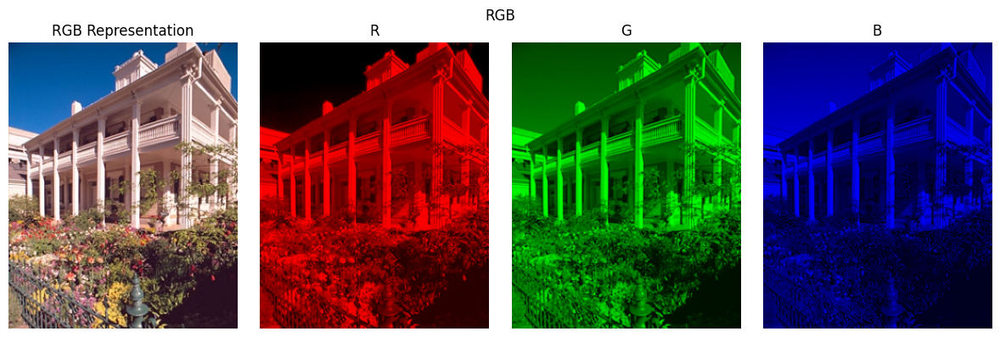

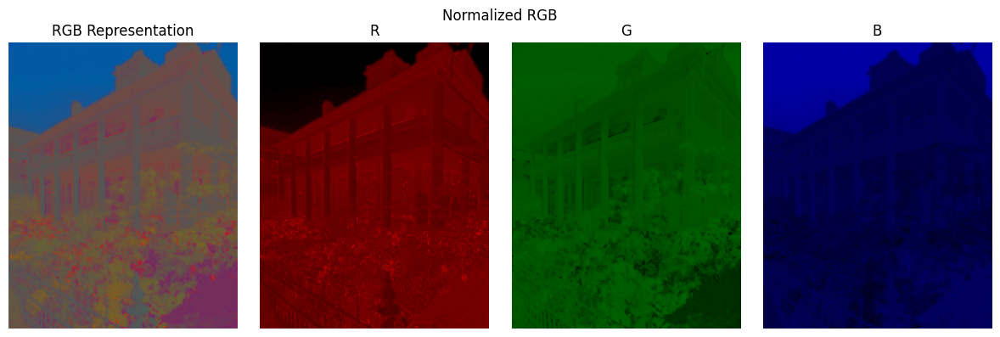

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.022995e-10..1.0].


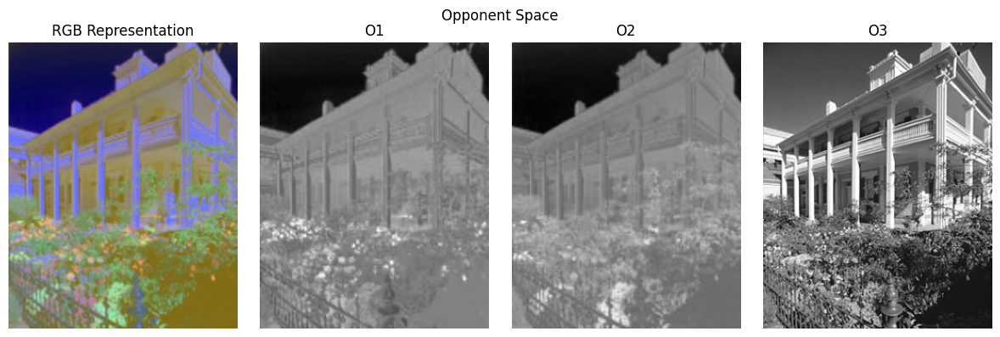

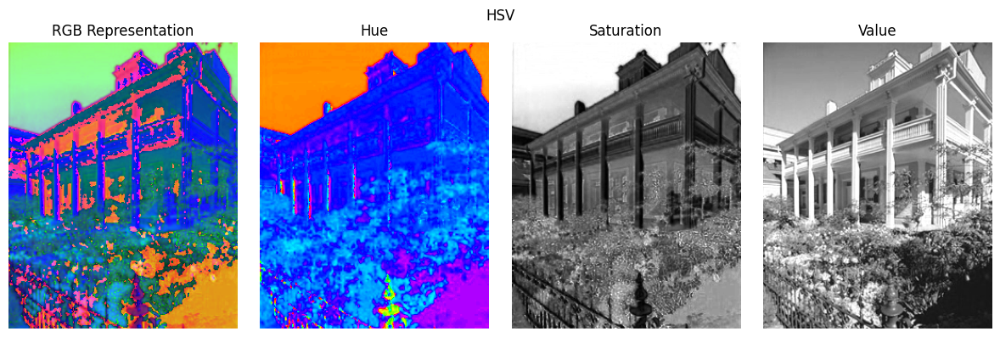

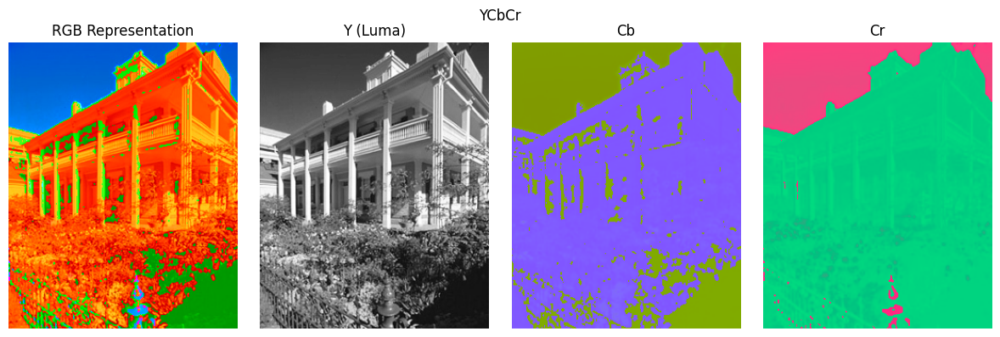

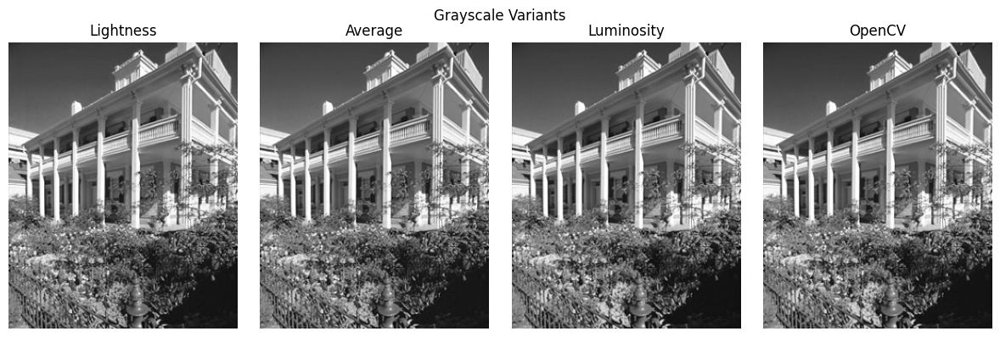

In [9]:
# Load and convert the image to RGB
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

colorspaces = ['rgb', 'nrgb', 'opponent', 'hsv', 'ycbcr', 'grays']
for cs in colorspaces:
    visualize_colourspace(image, cs)

<a id="question-4"></a>
#### <font color='#FF0000'>Question 4 (2 points)</font>

Explain each of the above 5 colour spaces and their properties. What are the benefits of using a different colour space other than RGB? Provide reasons for each of the above cases. You can include your observations from the visualizations.

##### <font color='yellow'>Answer:</font>

> RGB: Colors are formed by varying the intensity of primary colors, standard way cameras and displays render.\
>
> Opponent: Uses opponent pairs to form colors (red-green, blue-yellow, black-white). It seperates color information into contrasts instead of absolute values. This space models human perception more closely. It is often more robust to changes in lighting.
>
> HSV: Combines hue, the color type, saturation, the color purity, and value, the brightness, to form a color. HSV is useful for color detection under varying lighting, because hue is often invariant to shading.
>
> YCbCr: Combines the luma, blue difference, and red difference, seperating brightness from color information. It's useful in image compression because the human eye is more sensitive to intensity than to color
>
> Grays: Represents images using only intensity, removes all color information. It simplifies analysis, discarding color information unnecessary for i.e. edge detection.  



<a id="question-5"></a>
#### <font color='#FF0000'>Question 5 (1 point)</font>

Find one more colour space from the literature, briefly explain its properties and give a use case.

##### <font color='yellow'>Answer:</font>

> The CMYK color space is a color model that uses a combination of cyan, magenta, yellow and "key" (often black) inks to reproduce colors on a white background. In doing so, it subtracts from the light that would ordinarily be reflected, i.e. white minus red leaves cyan. CMYK is used in color printing.
>
> https://en.wikipedia.org/wiki/CMYK_color_model

<a id="section-2"></a>
### **Section 2: Colour Constancy**

Colour constancy is the ability to perceive the colors of objects consistently, regardless of the color of the light source. The goal of color constancy algorithms is to estimate the light source's illuminant and then correct the image so that it appears as if taken under a canonical (white) light source. In digital cameras, the automatic white balance (AWB) function performs this task to ensure images look natural.

In this part of the assignment, you will implement the well-known Grey-World Algorithm, a fundamental color constancy algorithm. This algorithm operates under the assumption that, under white light, the average color in a scene should be grey ([128, 128, 128]).

For more information, refer to the [Grey World algorithm on Wikipedia.](https://en.wikipedia.org/wiki/Color_normalization#Grey_world)

<a id="question-6"></a>
#### <font color='#FF0000'>Question 6 (8 points)</font>

Complete the function `apply_grey_world_algorithm` to apply color correction to an RGB image using the Grey-World algorithm.

Display the original image and the color-corrected one on the same figure. Use the `beehive_house.jpg` image to test your algorithm. You should see that the reddish color cast on the image is removed, making it look more natural.

***Note:*** You do not need to apply any pre or post-processing steps. For the calculation or processing, you are not allowed to use any available code or any dedicated library function except *standard Numpy functions*.

In [10]:
def apply_grey_world_algorithm(awb_img):
    """
    Apply the Grey-World algorithm to correct the color balance of an RGB image.

    This function assumes that under a white light source, the average color in a scene should be grey.
    It corrects the image by scaling each channel so that the mean of each channel is equal.

    Args:
        awb_img: RGB image to be color corrected

    Returns:
        gw_img: Color corrected image using the Grey-World algorithm
    """
    
    awb_img = awb_img.astype(np.float32)

    B = awb_img[:,:, 0] 
    G = awb_img[:,:, 1] 
    R = awb_img[:,:, 2] 

    B_avg = np.average(B)
    R_avg = np.average(R)
    G_avg = np.average(G)

    gamma = 128 / B_avg
    beta = 128 / G_avg
    alpha = 128 / R_avg

    awb_img[:,:, 0] *= gamma
    awb_img[:,:, 1] *= beta
    awb_img[:,:, 2] *= alpha

    return np.clip(awb_img, 0, 255).astype(np.uint8)

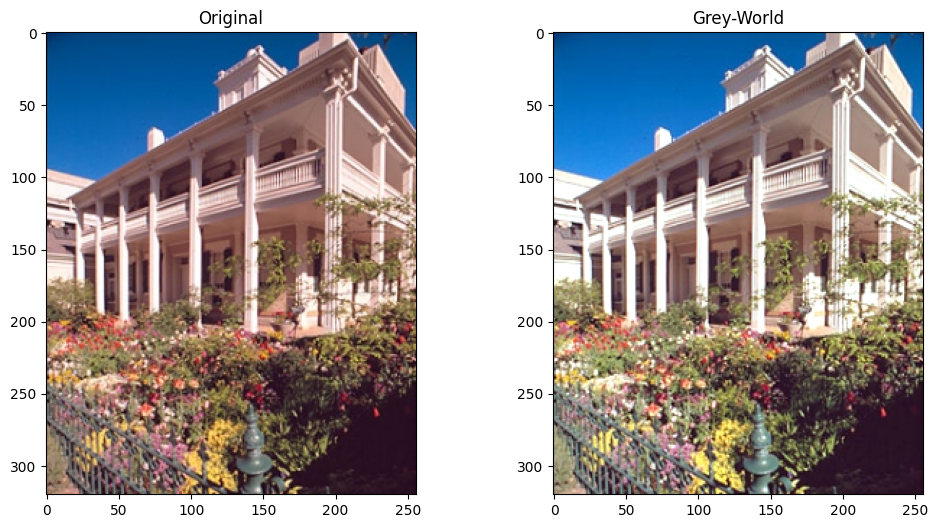

In [11]:
# load and convert the image to rgb
image = cv2.imread('images/beehive_house.jpg')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

gw_img = apply_grey_world_algorithm(image)

plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
plt.imshow(image)
plt.title('Original')

plt.subplot(1,2,2)
plt.imshow(gw_img)
plt.title('Grey-World')

plt.show()

<a id="question-7"></a>
#### <font color='#FF0000'>Question 7 (2 points)</font>

Give an example case for Grey-World Algorithm on where it might fail. Include your reasoning.

##### <font color='yellow'>Answer:</font>

> An example where the Grey-World algorithm might fail is an image with a strong predominance of a single color, such as a picture of a red bowl of apples. In this situation, the algorithm might overcompensate by reducing the red channel and boosting the green and blue channels, creating an unnatural color shift. 

<a id="question-8"></a>
#### <font color='#FF0000'>Question 8 (3 points)</font>

Find out one more colour constancy algorithm from the literature and explain it briefly.

##### <font color='yellow'>Answer:</font>

> The Gamut Mapping algorithm estimates the gamut of colors in an image under an unknown light source, using observed colors in an input image. It then determines feasible mappings that can transform the observed image colors so that they fall within the computed gamut. Then, using an estimator, the best mapping is selected.
>
> Aulakh, A. S., & Arora, A. (2013). A review on color constancy algorithms. Int. J. Engineer. Innov. Tech, 3(4), 180-183.

<a id="section-3"></a>
### **Section 3: Intrinsic Image Decomposition**

Intrinsic image decomposition is the process of separating an image into its formation components, such as reflectance (albedo) and shading (illumination). <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1) Then, under the assumptions of body (diffuse) reflection, linear sensor response and narrow band filters, the decomposition of the observed image $I(\vec{x})$ at position $\vec{x}$ can be approximated as the element-wise product of its albedo $R(\vec{x})$ and shading $S(\vec{x})$ intrinsics:

$$I(\vec{x})=R(\vec{x}) \times S(\vec{x})$$

In this part of the assignment, you will experiment with intrinsic image components to perform a particular computational photography application: material recolouring. For the experiments, we will use images from a synthetic intrinsic image dataset. <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2)

<a name="cite_note-1"></a><small>[1.](#cite_ref-1) H. G. Barrow and J. M. Tenenbaum. Recovering intrinsic scene characteristics from images. Computer Vision Systems, pages 3-26, 1978.</small>

<a name="cite_note-2"></a><small>[2.](#cite_ref-1) http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/


<a id="question-9"></a>
#### <font color='#FF0000'>Question 9 (2 points)</font>

In what other components can an image be decomposed other than albedo and shading? Give an example and explain the concepts in your answer.

##### <font color='yellow'>Answer:</font>

> An image can be decomposed into reflective and diffuse components too. The diffuse component reflects the color of the surface that scatters light uniformly and omnidirectionally, such as the red of an apple. The reflective component represents reflections of light sources on the surface, such as the glossy surface of a polished car. 

<a id="question-10"></a>
#### <font color='#FF0000'>Question 10 (2 points)</font>

If you check the literature, you will see that almost all intrinsic image decomposition datasets are composed of synthetic images. What might be the reason for that?

##### <font color='yellow'>Answer:</font>

> For each real image, one would need the exact albedo and shading components, which are exceedingly difficult to obtain, as they are not fully measurable in a real life scene. When generating a synthetic image, one has precise control over the entire scene, allowing the generation of an accurate ground truth for the intrinsics.
>
> Li, Z., & Snavely, N. (2018). Cgintrinsics: Better intrinsic image decomposition through physically-based rendering. In Proceedings of the European conference on computer vision (ECCV) (pp. 371-387).

<a id="question-11"></a>
#### <font color='#FF0000'>Question 11 (4 points)</font>

Choose an object with a single color from the `/intrinsic_images/` folder, which is based on the [synthetic intrinsic image dataset](http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/).

Demonstrate that you can reconstruct the original PNG image from its intrinsics using the albedo and shading. Your script should output a figure displaying the original image, its intrinsic images, and the reconstructed one. Complete the function `reconstruct_image_from_intrinsics()`.


In [12]:
def reconstruct_image_from_intrinsics(albedo_img, shading_img):
    """
    Reconstruct the original image from its intrinsic images (albedo and shading).

    This function takes the albedo and shading images as input, 
    and reconstructs the original image by multiplying albedo with shading.

    Args:
        albedo_img: Image representing the albedo (reflectance)
        shading_img: Image representing the shading

    Returns:
        iid_img: Reconstructed image
    """

    albedo_float = albedo_img.astype(np.float32) / 255.0
    shading_float = shading_img.astype(np.float32) / 255.0

    iid_img = albedo_float * shading_float
    iid_img = np.clip(iid_img * 255, 0, 255).astype(np.uint8)

    return iid_img

object shape: (270, 480, 3)
object albedo shape: (270, 480, 3)
object shading shape: (270, 480, 3)


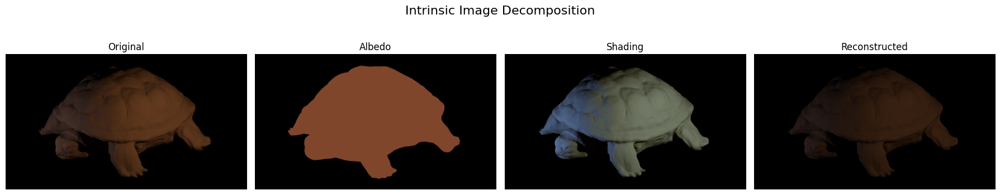

In [13]:
# Replace the object name with a valid name from the dataset
img_path = './intrinsic_images/'
object_name = 'turt_ml1'

# Read with opencv
obj = cv2.imread(img_path + object_name + '.png')
if obj is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + ".png"}')
else:
    print(f'object shape: {obj.shape}')

obj_sha = cv2.imread(img_path + object_name + '_shad.png')
if obj_sha is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name + "_shad.png"}')
else:
    print(f'object albedo shape: {obj_sha.shape}')

obj_alb = cv2.imread(img_path + object_name.split('_')[0] + '_refl.png')
if obj_alb is None:
    raise FileNotFoundError(f'No image found with filename: {img_path + object_name.split("_")[0] + "_refl.png"}')
else:
    print(f'object shading shape: {obj_alb.shape}')

fig = plt.figure(figsize=(18,4))
fig.suptitle('Intrinsic Image Decomposition', fontsize=16)

ax1 = fig.add_subplot(1,4,1)
ax1.imshow(cv2.cvtColor(obj, cv2.COLOR_BGR2RGB)) 
ax1.set_title('Original')
ax1.axis('off')

ax2 = fig.add_subplot(1,4,2)
ax2.imshow(cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB))
ax2.set_title('Albedo')
ax2.axis('off')

ax3 = fig.add_subplot(1,4,3)
ax3.imshow(cv2.cvtColor(obj_sha, cv2.COLOR_BGR2RGB))
ax3.set_title('Shading')
ax3.axis('off')

ax4 = fig.add_subplot(1,4,4)
reconstructed = reconstruct_image_from_intrinsics(obj_alb, obj_sha)
ax4.imshow(cv2.cvtColor(reconstructed, cv2.COLOR_BGR2RGB))
ax4.set_title('Reconstructed')
ax4.axis('off')

plt.tight_layout()
plt.show()

<a id="question-12"></a>
#### <font color='#FF0000'>Question 12 (2 points)</font>

Manipulating colors in photographs is an important problem with many applications in computer vision. Recoloring algorithms aim to manipulate colors effectively, and better results can be obtained if the albedo image is available as it is independent of confounding illumination effects.

First determine the true material color of the object you picked in RGB space (uniform color in this case). 

- Complete the code for the function `get_true_color()`.
- Plot the true color of the object in RGB space, make sure to also plot each channel separately. 

**Hint:** You can use `np.tile` to create a visualization of the true color.

In [14]:
def get_true_color(albedo_img):
    """
    Determines the true material color of the object in the albedo image.

    This function calculates the average RGB color in the albedo image, which represents the true material color of the object.

    Args:
        albedo_img: Albedo (reflectance) image

    Returns:
        true_colour: True material color of the object in RGB space
    """

    albedo_img = albedo_img.astype(np.float32) / 255.0
    mean_color = np.mean(albedo_img, axis=(0,1))  
    true_colour = tuple((mean_color * 255).astype(np.uint8)) 

    return true_colour

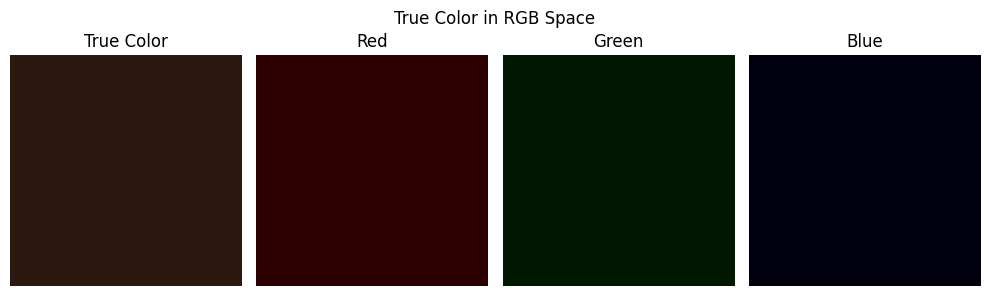

In [15]:
# get the true color of the object's albedo image
obj_alb_rgb = cv2.cvtColor(obj_alb, cv2.COLOR_BGR2RGB)
true_color = get_true_color(obj_alb_rgb)

tc_tile = np.tile(true_color, (80, 80, 1))

R = np.tile([true_color[0], 0, 0], (80, 80, 1))
G = np.tile([0, true_color[1], 0], (80, 80, 1))
B = np.tile([0, 0, true_color[2]], (80, 80, 1))

images = [tc_tile, R, G, B]
titles = ["True Color", "Red", "Green", "Blue"]

fig, axs = plt.subplots(1, 4, figsize=(10, 3))
for ax, image, title in zip(axs, images, titles):
    ax.imshow(image)
    ax.set_title(title)
    ax.axis("off")

plt.suptitle("True Color in RGB Space", fontsize=12)
plt.tight_layout()
plt.show()

<a id="question-13"></a>
#### <font color='#FF0000'>Question 13 (2 points)</font>

Assume you are given the PNG image and have access to its intrinsic albedo and shading images.

Recolor the object's image with pure red (255, 0, 0). Complete the code for the function `recolor_image()`. Display the recolored version of the object. Make sure to also plot each channel separately.

In [16]:
def recolor_image(albedo_img, shading_img):
    """
    Recolors an image based on its albedo and shading images.

    This function recolors the input albedo image by changing non-black pixels to red
    and then reconstructs the final image using the provided shading image.

    Args:
        albedo_img: Albedo (reflectance) image
        shading_img: Shading image

    Returns:
        recolored_img: Recolored and reconstructed image
    """

    # Normalize shading to [0,1]
    shading_float = shading_img.astype(np.float32) / 255.0

    # Pure red color normalized
    red_albedo = np.array([255, 0, 0], dtype=np.float32) / 255.0

    # Multiply shading with red color
    recolored_float = shading_float * red_albedo
    recolored_img = np.clip(recolored_float * 255, 0, 255).astype(np.uint8)

    return recolored_img




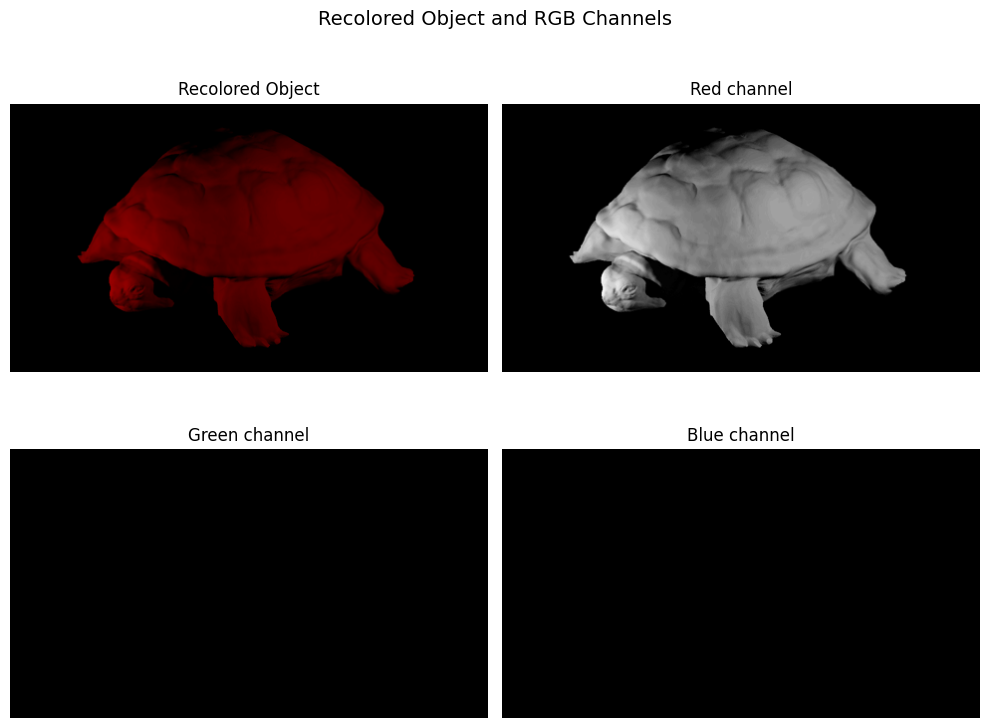

In [18]:
recolored_img = recolor_image(obj_alb, obj_sha)

fig, axes = plt.subplots(2, 2, figsize=(10, 8))

fig.suptitle('Recolored Object and RGB Channels', fontsize=14)

# top-left: full recolored image
axes[0, 0].imshow(recolored_img)
axes[0, 0].set_title('Recolored Object')
axes[0, 0].axis('off')

# top-right: red channel
axes[0, 1].imshow(recolored_img[..., 0], cmap='gray')
axes[0, 1].set_title('Red channel')
axes[0, 1].axis('off')

# bottom-left: green channel
axes[1, 0].imshow(recolored_img[..., 1], cmap='gray')
axes[1, 0].set_title('Green channel')
axes[1, 0].axis('off')

# bottom-right: blue channel
axes[1, 1].imshow(recolored_img[..., 2], cmap='gray')
axes[1, 1].set_title('Blue channel')
axes[1, 1].axis('off')

plt.tight_layout()  
plt.show()



<a id="question-14"></a>
#### <font color='#FF0000'>Question 14 (2 points)</font>

Although you have recoloured the object with pure red, the reconstructed images do not seem to display those pure colors and thus the colour distributions over the object do not appear uniform. Explain the reason.

##### <font color='yellow'>Answer:</font>

>As demonstrated in the last question, the recolored image is obtained by multiplying the new albedo with the original shading. In other words, it is a combination of the reflectance (in this case a pure red albedo) and shading components. 
> 
> So why is it that after recoloring with pure red, the reconstructed image does not appear uniformly red?
> 
> The reason for this is because even after replacing the reflectance with a pure red albedo, the shading still influences the final color of the image. As can be seen in the image, depending on the illumination and the orientation and shape of the surface, certain parts of the image appear more or less red. This in turn leads to a non-uniform color distribution in the recolored image.
> 
> Mathematically, we can write this as: Image = Albedo * Shading = (1,0,0) * Shading = (Shading_Red, 0, 0).

__Note:__  This was a simple case where the image is synthetic, object centered and has only one colour, and you have access to its ground-truth intrinsic images. Real world scenarios require more than just replacing a single colour with another, not to mention the complexity of achieving a decent intrinsic image decomposition.

<a id="section-4"></a>
### **Section 4: Photometric Stereo**

In this section, we delve into the photometric stereo technique, a method used to reconstruct a surface's shape from a set of images captured under varying lighting conditions. This approach is based on the principles outlined in Section 5.4 of Forsyth and Ponce's *Computer Vision: A Modern Approach*, which provides a comprehensive introduction to the theory and application of photometric stereo in computer vision.

Photometric stereo is particularly useful for capturing fine details of surface geometry. The core idea is to utilize an orthographic camera to take multiple images of a surface, each under different lighting conditions. By analyzing the variations in image intensity across these images, we can infer the surface normals and, subsequently, reconstruct the surface's height at each pixel, leading to what is commonly known as a height map or depth map.

The method assumes that the camera and the surface remain stationary, with illumination coming from different directions. By capturing enough images with different light source vectors, we can solve for the surface normals and albedo at each pixel.

<a id="question-15"></a>
#### <font color='#FF0000'>Question 15 (4 points)</font>

Start with the grayscale sphere model located in the SphereGray5 folder. The folder contains 5 images of a sphere with a grayscale checker texture under different lighting conditions. Your task is to estimate the surface reflectance (albedo) and surface normal of this model.

In this question, you will need to complete the function `estimate_albedo_and_normals()` to estimate the albedo and surface normal map for the SphereGray5 folder.

To assist you, two helper functions are provided:

- `load_synthetic_images()`: This function loads the synthetic images from the specified directory.
- `show_results()`: This function displays the albedo, surface normals, and optionally the height map and surface error.

These helper functions are provided to simplify the process of loading images and displaying your results.

**Hint**: To get the least-squares solution of a linear system, you can use the `numpy.linalg.lstsq` function.

Make sure to include images of your results in your notebook at key points. When visualizing 3D models, choose viewpoints that clearly illustrate the structure, and feel free to use multiple viewpoints if necessary.

In [19]:
from typing import Literal

def load_synthetic_images(image_dir='./photometrics_images/SphereGray5/', color_type: Literal["grayscale", "rgb"] = "grayscale"):
    """
    Loads synthetic images and their corresponding light source directions.

    This function reads all images from the specified directory, extracts the relevant channel, and stacks the images along the third dimension. It also extracts the light source directions from the image filenames and normalizes both the image stack and the light source vectors.

    Args:
        image_dir: directory containing the synthetic images
        channel: color channel to be extracted (default is 0, corresponding to the red channel)

    Returns:
        image_stack: a 3d numpy array of stacked images
        normalized_light_dirs: a 2d numpy array of normalized light source directions
    """
    # list all files in the image directory
    image_files = os.listdir(image_dir)
    num_images = len(image_files)

    image_stack = None
    light_directions = None

    # assumed z component for the light direction
    z_component = 0.5

    # loop through all image files
    for i in range(num_images):
        # read the input image
        image = cv2.imread(os.path.join(image_dir, image_files[i]))
        image = np.flip(image, axis=-1)  # flip the image to correct the channel order
        if color_type == "rgb":
            # turn image to rgb
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
        else:
            # if grayscale, take only one channel
            image = image[:, :, [0]]

        # initialize image stack and light direction array on the first iteration
        if image_stack is None:
            height, width, channels = image.shape
            print('image size (h*w): %d*%d' % (height, width))
            image_stack = np.zeros([height, width, channels, num_images], dtype=int)
            light_directions = np.zeros([num_images, 3], dtype=np.float64)

        # stack the image along the third dimension
        image_stack[:, :, :, i] = image

        # extract light direction from the image filename
        x_component = np.double(image_files[i][(image_files[i].find('_') + 1):image_files[i].rfind('_')])
        y_component = np.double(image_files[i][image_files[i].rfind('_') + 1:image_files[i].rfind('.png')])
        light_directions[i, :] = [x_component, -y_component, z_component]

    # convert the image stack to double precision for further processing
    image_stack = np.double(image_stack).squeeze()

    # normalize the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)

    # handle the case where all pixel values are the same
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)

    # normalize the light direction vectors
    norm_factors = np.tile(np.sqrt(np.sum(light_directions ** 2, axis=1, keepdims=True)), (1, light_directions.shape[1]))
    normalized_light_dirs = light_directions / norm_factors

    return image_stack, normalized_light_dirs

In [20]:

from matplotlib.colors import LinearSegmentedColormap

def plot_SE(normals, SE, stride=1, suffix="", **kwargs):
    # Create meshgrid for plotting 3D surfaces
    X, Y, _ = np.meshgrid(np.arange(0, np.shape(normals)[0], stride),
                          np.arange(0, np.shape(normals)[1], stride),
                          np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]

    H_SE = SE[::stride, ::stride]
    H_SE[H_SE == 0] = np.nan  # avoid plotting zeros

    fig = plt.figure(figsize=(12, 6))

    # Define custom pink-to-red colormap
    pink_to_red = LinearSegmentedColormap.from_list("pink_to_red", ["#ffe6eb", "#ff0000"])

    # Left: 2D image of SE with 'hot' colormap
    ax_img = fig.add_subplot(1, 2, 1)
    im = ax_img.imshow(H_SE, cmap=pink_to_red, vmin=0, vmax=1)
    if suffix:
        ax_img.set_title(f'SE (image) {suffix}', fontsize=14)
    else:
        ax_img.set_title('SE (image)', fontsize=14)
    ax_img.set_axis_off()
    fig.colorbar(im, ax=ax_img, fraction=0.046, pad=0.04)

    # Right: original 3D surface plot of SE
    ax3d = fig.add_subplot(1, 2, 2, projection='3d')
    ax3d.plot_surface(X, Y, H_SE.T, cmap=pink_to_red, vmin=0, vmax=1)
    if suffix:
        ax3d.set_title(f"SE (3D) {suffix}", fontsize=14)
    else:
        ax3d.set_title("SE (3D)", fontsize=14)

    plt.tight_layout()
    plt.show()


def plot_p_and_q(p, q, suffix="", **kwargs):
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))
    axs[0].imshow(p, cmap='gray')
    if suffix:
        axs[0].set_title(f'Partial Derivative p (df/dx) {suffix}')
    else:
        axs[0].set_title('Partial Derivative p (df/dx)')
    axs[1].imshow(q, cmap='gray')
    if suffix:
        axs[1].set_title(f'Partial Derivative q (df/dy) {suffix}')
    else:
        axs[1].set_title('Partial Derivative q (df/dy)')
    plt.show()


def plot_albedo(albedo, original_image_path=None, suffix="", **kwargs):
    """
    Displays the albedo map and optionally the original image.

    Args:
        albedo: albedo (reflectance) map
        original_image_path: path to original image to display left of albedo (optional)
    """
    # showing albedo map
    albedo_max = 1  # normalize albedo values
    albedo = albedo / albedo_max

    # Plot magnitude of exceeding values (amount above 1) to see where bigger errors come from
    mag_exceed = albedo - 1
    mag_exceed = np.where(mag_exceed > 0, mag_exceed, 0)

    if original_image_path is not None:
        fig, (ax_orig, ax_alb, ax_mag) = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
    else:
        fig, (ax_alb, ax_mag) = plt.subplots(1, 2, figsize=(10, 5), constrained_layout=True)

    if original_image_path is not None:
        img = plt.imread(original_image_path)
        if img.ndim == 3:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            cmap = None
        else:
            cmap = 'gray'
        ax_orig.imshow(img, cmap=cmap)
        ax_orig.set_title('Original Image', fontsize=16)
        ax_orig.axis('off')

    ax_alb.imshow(albedo, cmap="gray")
    if suffix:
        ax_alb.set_title(f'Albedo Map {suffix}', fontsize=16)
    else:
        ax_alb.set_title('Albedo Map', fontsize=16)
    ax_alb.axis('off')

    ax_mag.imshow(mag_exceed, cmap='hot')
    if suffix:
        ax_mag.set_title(f'Magnitude Above 1 (Albedo - 1) {suffix}', fontsize=16)
    else:
        ax_mag.set_title('Magnitude Above 1 (Albedo - 1)', fontsize=16)
    ax_mag.axis('off')
    fig.colorbar(ax_mag.imshow(mag_exceed, cmap='hot'), ax=ax_mag, label='Amount above 1')
    plt.show()


def plot_surface_normals(normals, suffix="", **kwargs):
    """
    Displays the surface normal map.
    Args:
        normals: surface normal map
    """

    # showing normals as three separate channels
    figure = plt.figure(figsize=(10, 10))
    ax1 = figure.add_subplot(221)
    ax1.imshow(normals[..., 0], vmin=-1, vmax=1, cmap='viridis')
    ax1.set_axis_off()
    if suffix:
        ax1.set_title(f'Normal Channel x {suffix}', fontsize=16)
    else:
        ax1.set_title('Normal Channel x', fontsize=16)
    ax2 = figure.add_subplot(222)
    ax2.imshow(normals[..., 1], vmin=-1, vmax=1, cmap='viridis')
    ax2.set_axis_off()
    if suffix:
        ax2.set_title(f'Normal Channel y {suffix}', fontsize=16)
    else:
        ax2.set_title('Normal Channel y', fontsize=16)
    ax3 = figure.add_subplot(223)
    ax3.imshow(normals[..., 2], vmin=-1, vmax=1, cmap='viridis')
    ax3.set_axis_off()
    if suffix:
        ax3.set_title(f'Normal Channel z {suffix}', fontsize=16)
    else:
        ax3.set_title('Normal Channel z', fontsize=16)
    ax4 = figure.add_subplot(224)
    ax4.imshow((normals + 1) * 0.5)
    ax4.set_axis_off()
    if suffix:
        ax4.set_title(f'Combined Normals {suffix}', fontsize=16)
    else:
        ax4.set_title('Combined Normals', fontsize=16)

    step = 20                                  
    h, w = normals.shape[:2]
    scale = 0.10 * min(h, w)                   
    Y, X = np.mgrid[0:h:step, 0:w:step]        
    U = scale * normals[::step, ::step, 0]     
    V = -scale * normals[::step, ::step, 1]    

    ax4.quiver(X, Y, U, V,
               angles='xy', scale_units='xy', scale=1,   
               color='lime', width=0.003, alpha=0.9)
    ax4.set_xlim(0, w)
    ax4.set_ylim(h, 0)

    plt.show()


def plot_height_map(height_map, SE=None, stride=1, suffix="", **kwargs):
    """
    Plots the 3D surface of the height map.
    """

    # Create meshgrid for plotting 3D surfaces
    X, Y, _ = np.meshgrid(np.arange(0, np.shape(height_map)[0], stride),
                          np.arange(0, np.shape(height_map)[1], stride),
                          np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]

    if SE is not None:
        # Show both heightmap and SE in a 1x2 subplot
        fig = plt.figure(figsize=(8, 4))

        # Show heightmap
        ax1 = fig.add_subplot(1, 2, 1, projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax1.plot_surface(X, Y, H_height_map.T)
        if suffix:
            ax1.set_title(f"Height Map {suffix}")
        else:
            ax1.set_title("Height Map")

        # Show SE
        ax2 = fig.add_subplot(1, 2, 2, projection='3d')
        H_SE = SE[::stride, ::stride]
        ax2.plot_surface(X, Y, H_SE.T, color='r')
        if suffix:
            ax2.set_title(f"SE {suffix}")
        else:
            ax2.set_title("SE")

        plt.tight_layout()
        plt.show()

        plot_SE(height_map, SE, stride, suffix=suffix)

    else:
        fig = plt.figure()
        ax = fig.add_subplot(projection='3d')
        H_height_map = height_map[::stride, ::stride]
        ax.plot_surface(X, Y, H_height_map.T)
        if suffix:
            ax.set_title(f"Height Map {suffix}")
        else:
            ax.set_title("Height Map")
        plt.show()

def show_results(albedo, normals, suffix="", original_image_path=None, height_map=None, SE=None, stride=1):
    """
    Displays the albedo, normals, and optionally the height map and surface error (SE).

    Args:
        albedo: albedo (reflectance) map
        normals: surface normal map
        original_image_path: path to original image to display left of albedo (optional)
        height_map: reconstructed height map (optional)
        SE: surface error map (optional)
        stride:
    """

    if albedo is not None:
        plot_albedo(albedo, original_image_path, suffix)

    plot_surface_normals(normals, suffix)

    # Only show heightmap if it's available
    if height_map is not None:
        plot_height_map(height_map, SE, stride, suffix=suffix)

    # Only show SE if it's available
    elif SE is not None:
        plot_SE(SE, suffix=suffix)

Following the guidelines in *Computer Vision: A Modern Approach* by Forsyth and Ponce, Chapter 5, Section 5.4, you will complete the `estimate_albedo_and_normals()` function by implementing the following steps:

1. **Iterate through each point in the image array**:
   - For each pixel, extract the intensity values across all images and stack them into a vector `i`.

2. **Construct the diagonal matrix**:
   - Construct the diagonal matrix `scriptI` using the vector `i`.

3. **Solve the linear system**:
   - Solve the equation `scriptI * scriptV * g = scriptI * i` to obtain the vector `g` for each pixel.

4. **Compute the albedo**:
   - The albedo at each pixel is the magnitude (norm) of the vector `g`, denoted as `|g|`.

5. **Compute the surface normal**:
   - The surface normal at each pixel is given by `g / |g|`, where `|g|` is non-zero.

In [21]:
def estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True):
    """
    Estimates the surface albedo and normals from a stack of images.

    This function computes the albedo and surface normals for each pixel in the
    image stack using the provided light source directions. Optionally, it applies
    the shadow trick to improve the robustness of the solution.

    Args:
        image_stack: The stack of images of the surface, stacked along the third dimension.
        scriptV: The matrix containing the source and camera information.
        shadow_trick: Boolean indicating whether to use the shadow trick (default is True).

    Returns:
        albedo: The estimated surface albedo.
        normal: The estimated surface normals.
    """

    h, w, _ = image_stack.shape

    # create arrays for the albedo and normals
    albedo = np.zeros([h, w])
    normals = np.zeros([h, w, 3])

    for i in range(h):
        for j in range(w):
            # Extract the intensity values for the current pixel
            i_vec = image_stack[i, j, :]


            if shadow_trick:
                # Apply the shadow trick if enabled
                A = i_vec.reshape(-1, 1) * scriptV # Taking advantage of broadcasting, faster than scriptI @ scriptV
                b = i_vec ** 2 # Faster than scriptI @ i_vec
            else:
                A = scriptV
                b = i_vec

            g, _, _, _ = np.linalg.lstsq(A, b, rcond=None)

            # Compute the albedo and normals
            albedo[i, j] = np.linalg.norm(g)
            normals[i, j] = g / albedo[i, j] if albedo[i, j] != 0 else np.zeros(3)

    return albedo, normals

image size (h*w): 512*512


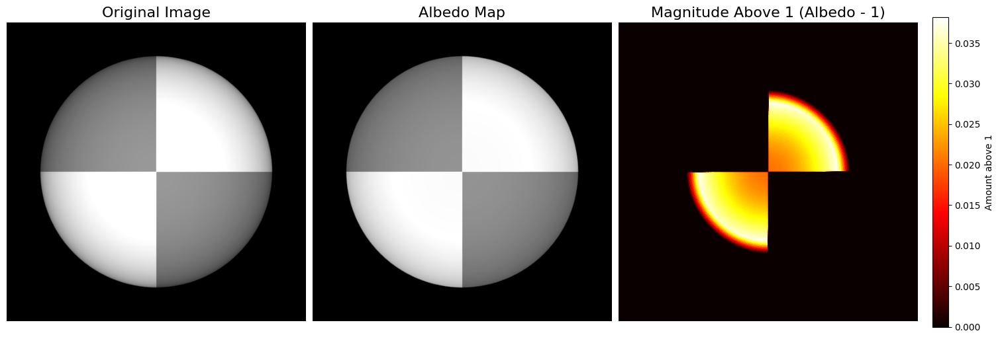

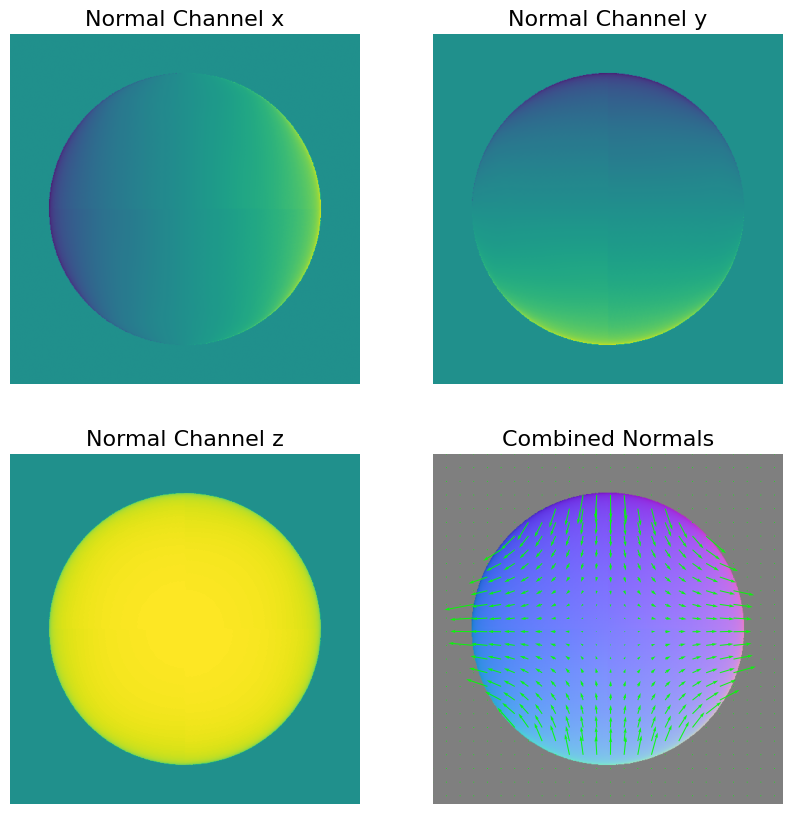

In [22]:
# load synthetic images for SphereGray5
image_stack, scriptV = load_synthetic_images("./photometrics_images/SphereGray5/", color_type="grayscale")


# estimate albedo and normals
albedo_s5, normals_s5 = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True)

# show results
plot_albedo(albedo_s5, original_image_path="photometrics_images/SphereGray5/Sphere_0.0_0.0.png")

plot_surface_normals(normals_s5)

<a id="question-16"></a>
#### <font color='#FF0000'>Question 16 (2 points)</font>

After implementing the `estimate_albedo_and_normals()` function, what do you expect to see in the albedo image? How does this compare to your actual result? Explain the differences.

##### <font color='yellow'>Answer:</font>

> After implementing the code to estimate the albedo and surface normals, we expected to see an albedo image that was solely represented by the object color and without being influenced by any shading or lighting effects. Visually, the albedo image should show a sphere with a four quadrant gray checker, where the background is black and each quadrant is almost a constant gray.
>
> After comparing the actual result to the original image, which was filmed from the [0,0] viewing direction, both images were very similar
>
> Nonetheless, we detected some slight changes in color of the edges of the sphere, which are due to the illumination geometry (the surface normal is perpendicular to the viewing direction, which leads to darker edges / shadows).

<a id="question-17"></a>
#### <font color='#FF0000'>Question 17 (1 point)</font>

In principle, what is the minimum number of images you need to estimate the albedo and surface normal? Explain your reasoning.

##### <font color='yellow'>Answer:</font>

> The minimum number of images needed to estimate the albedo and surface normal is 3 images. 
>
> This is because, for each pixel, we are trying to solve 
>$$
\mathcal{I} \mathcal{V} \mathbf{g} = \mathcal{I} \mathbf{i}
>$$ 
>
> where g has 3 unknown values (g = [gx, gy, gz]).
>
> Therefore, from each image we get one equation per pixel. So to estimate the albedo and surface normal, where we have 3 unknown values per pixel, we need at least 3 images. 
>
> Furthermore, each image needs to be under different lighting source directions so that we have linearly independent equations, because if not then the rank of V will be less than 3 and we wont be able to solve for g.



<a id="question-18"></a>
#### <font color='#FF0000'>Question 18 (2 points)</font>

Now, run the algorithm with more images by using the SphereGray25 folder. Observe the differences in the results when using more images. Report your findings. 

You could try all images at once or a few at a time, incrementally. Choose a strategy and justify it by discussing your results.

image size (h*w): 512*512


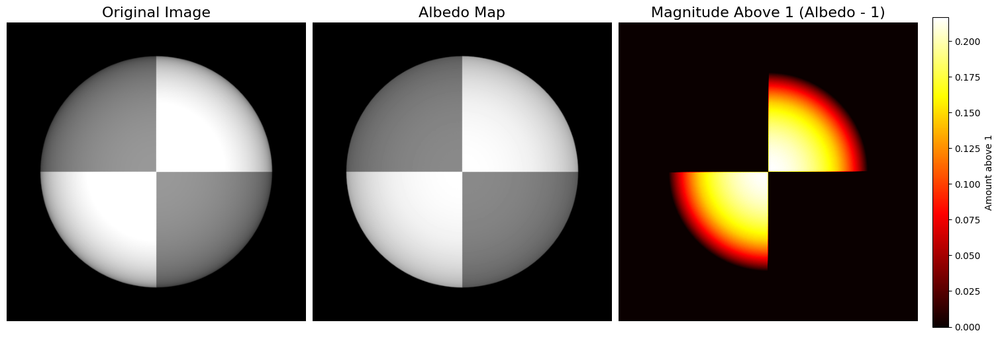

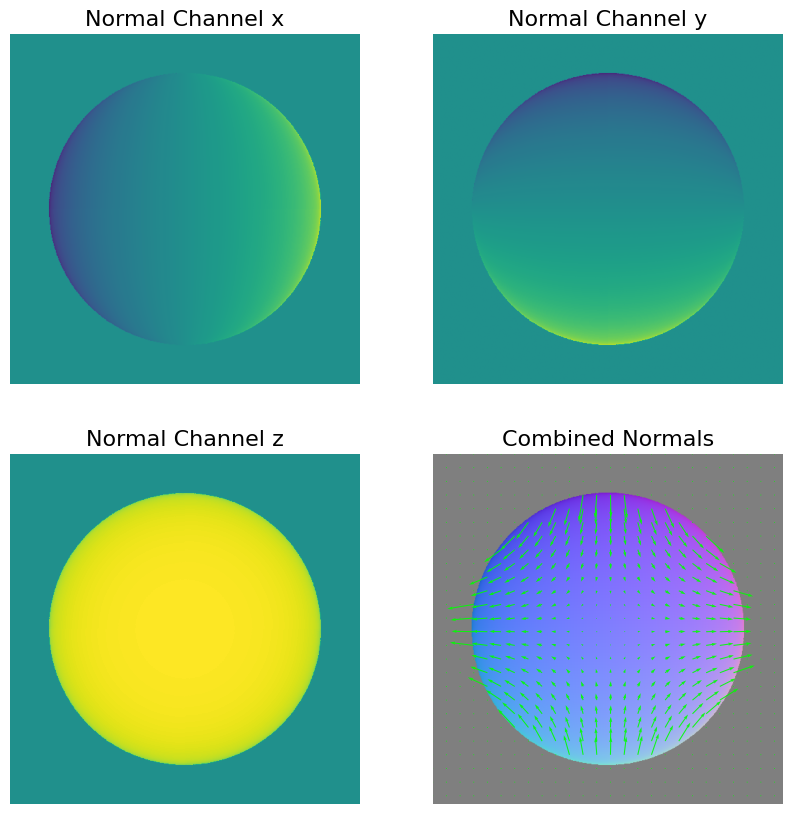

In [23]:
# load synthetic images for SphereGray25
image_stack, scriptV = load_synthetic_images("./photometrics_images/SphereGray25/")


# estimate albedo and normals
albedo_s25, normals_s25 = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=True)

# show results
show_results(albedo_s25, normals_s25, original_image_path="photometrics_images/SphereGray25/Sphere_0.0_0.0.png")

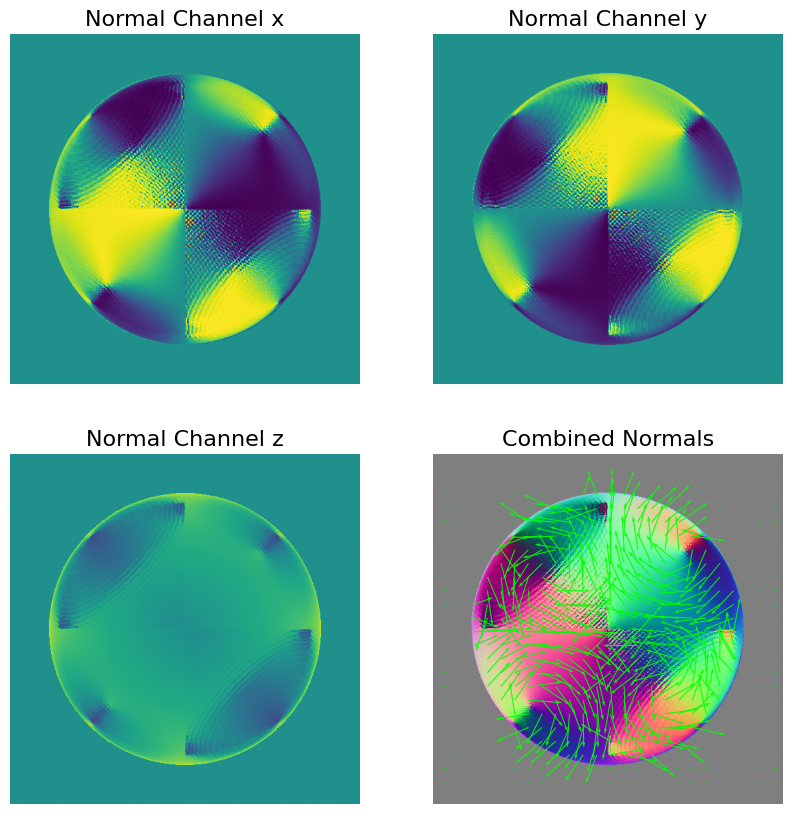

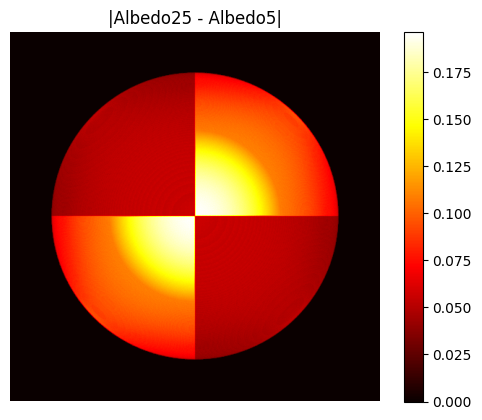

In [24]:
# build a normalized difference field from the two normal maps (show the direction of the normals, independent of how strong they are)
diff_field = normals_s25 - normals_s5
diff_field /= (np.linalg.norm(diff_field, axis=2, keepdims=True) + 1e-8)

plot_surface_normals(diff_field)

# -------------------------------------

# build a difference image from the two albedo maps
diff = albedo_s25 - albedo_s5

plt.imshow(np.abs(diff), cmap='hot')
plt.title('|Albedo25 - Albedo5|')
plt.axis('off')
plt.colorbar()
plt.show()


##### <font color='yellow'>Answer:</font>

> We used all 25 images at once to get the best possible estimate of g.
>
> When comparing visually the SphereGray25 and SphereGray5 folders, their albedo and normal maps seem very similar. So, to be able to better spot their differences we plotted the absolute difference between the two albedo maps and the normalized difference between the two normal maps.
>
>
>The normalized difference field is
>$$
>\hat{\mathbf d}
= \frac{\mathbf n_{25} - \mathbf n_{5}}
       {\left\lVert \mathbf n_{25} - \mathbf n_{5} \right\rVert + \varepsilon}\
>$$
>
> From the plot that shows the absolute difference between the two albedo maps, we can see that they deviate mostly from each other in the center of the sphere. 
>
> Also, when using more images the normal maps appear smoother and with less noise. This is because having more images means having more information regarding the surface orientation, which leads to a better estimate of the normals.
>
> When using more images (25 in total) we observed that the albedo map is more uniform in color and the edges are more defined (less shadows around the edges of the sphere). 
>
> Theoretically, using more images leads to better results. This is due to the system being overdetermined (since we have 25 images, and each image provides a linear equation, then we have 25 equations for 3 unknowns (gx,gy,gz)). Having more equations than unknowns means our system is overdetermined and least squares has more measurements to average, which reduces noise and leads to a more accurate estimate of g (least squares minimizes the error over all 25 equations, so it is less sensitive to noise).
> 
>
> In conclusion, using all 25 images gives overall better and more robust estimates. 

<a id="question-19"></a>
#### <font color='#FF0000'>Question 19 (2 points)</font>

Consider the impact of shadows in photometric stereo. Explain the trick mentioned in the textbook to deal with shadows.

Remove this trick from your implementation and check your results. Is the trick necessary when using 5 images? How about when using 25 images?

image size (h*w): 512*512
image size (h*w): 512*512

SphereGray5: no shadow trick


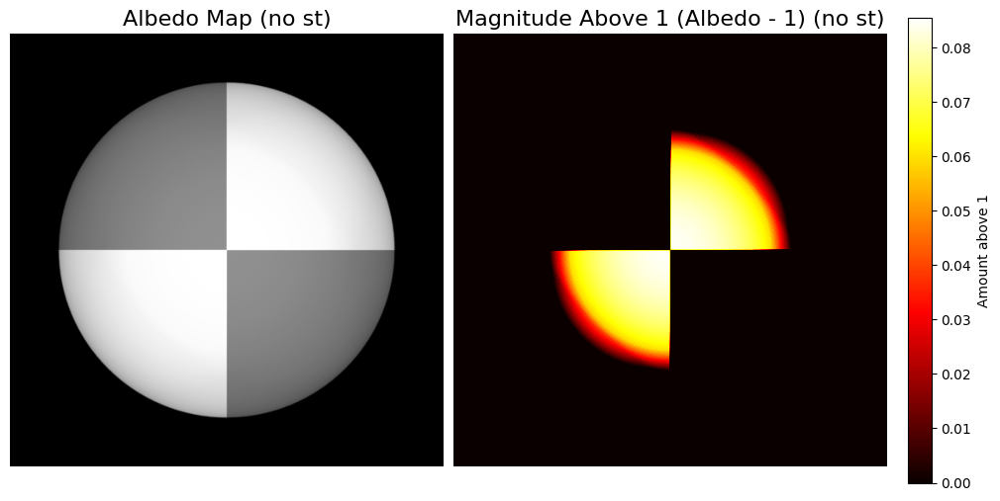

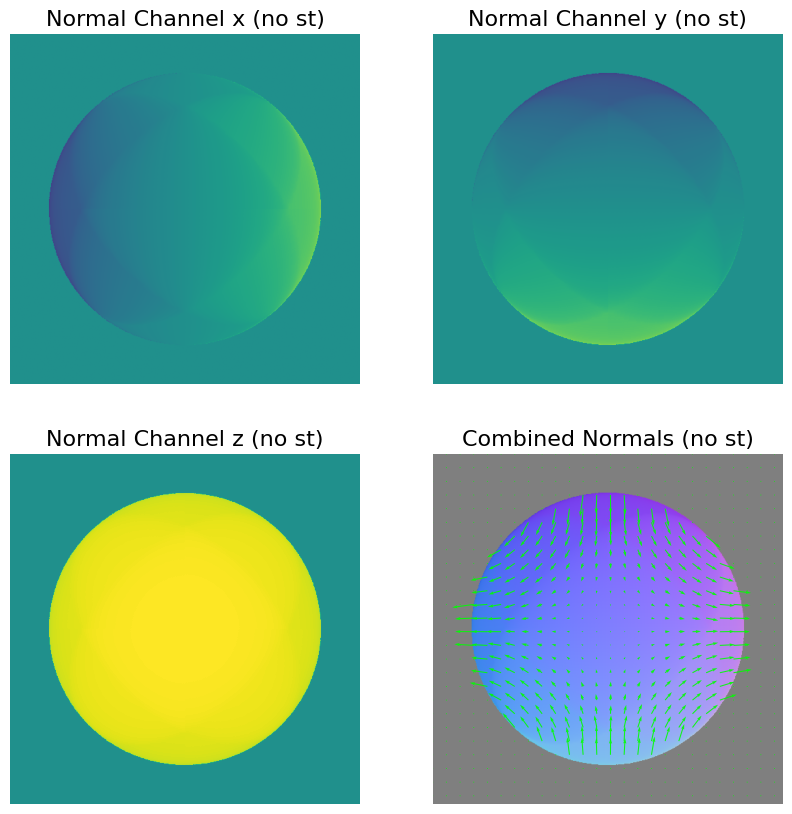


SphereGray25: no shadow trick


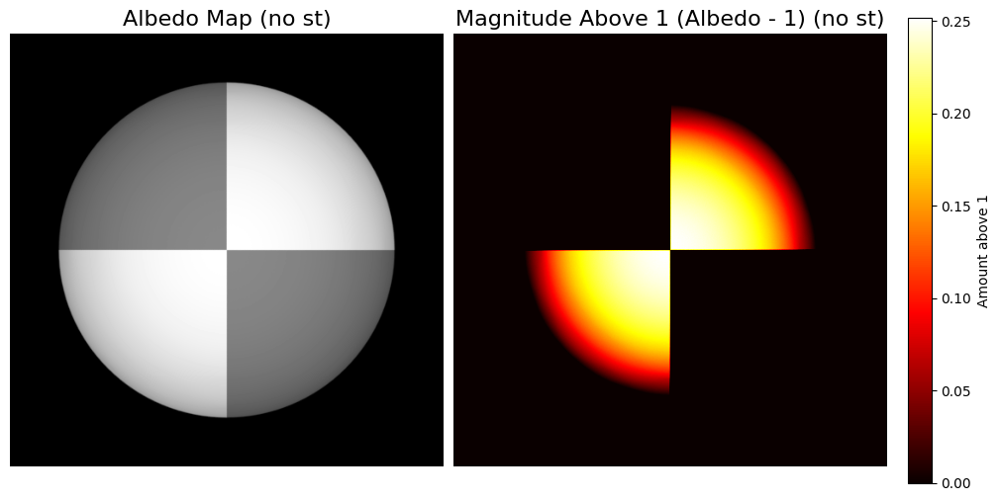

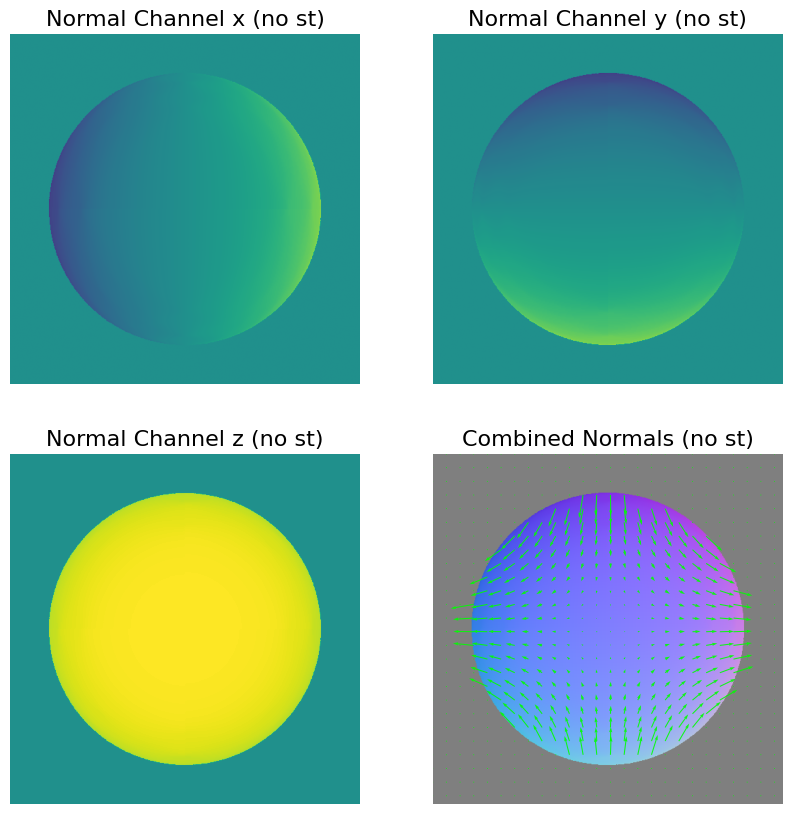

In [25]:
# load synthetic images for SphereGray5 and SphereGray25
image_stack5, scriptV5  = load_synthetic_images('./photometrics_images/SphereGray5/')
image_stack25, scriptV25 = load_synthetic_images('./photometrics_images/SphereGray25/')

# estimate albedo and normals without shadow trick
albedo_5_no_shadow, normals_5_no_shadow  = estimate_albedo_and_normals(image_stack5, scriptV5,  shadow_trick=False)
albedo_25_no_shadow, normals_25_no_shadow = estimate_albedo_and_normals(image_stack25, scriptV25, shadow_trick=False)

# show results without shadow trick
print("\nSphereGray5: no shadow trick")
show_results(albedo_5_no_shadow, normals_5_no_shadow, suffix="(no st)")

print("\nSphereGray25: no shadow trick")
show_results(albedo_25_no_shadow, normals_25_no_shadow, suffix="(no st)")

S5 normals: normalized difference (with shadow trick - without). 


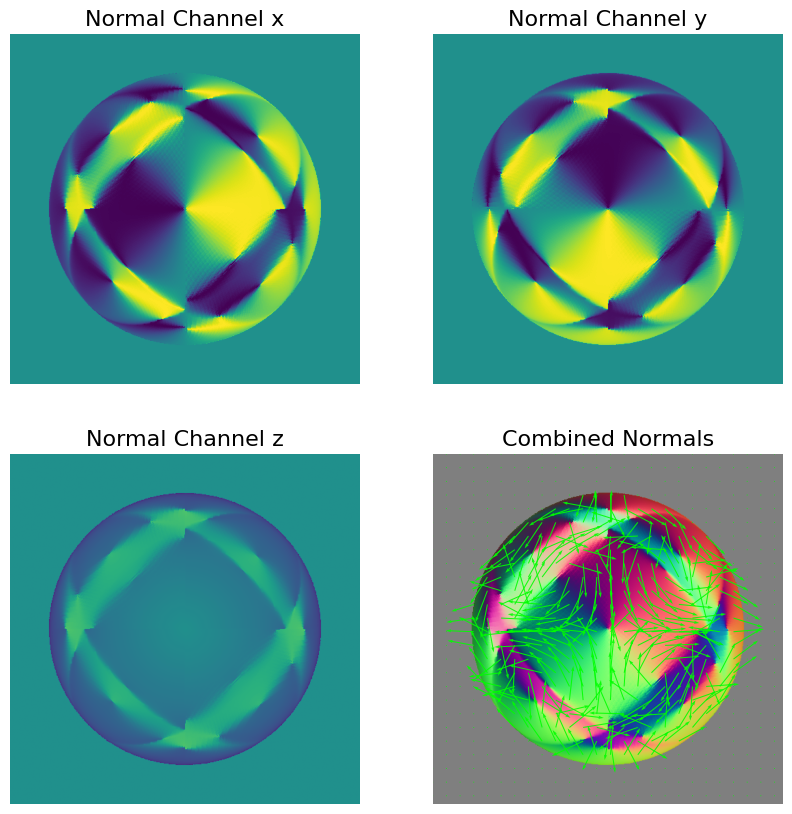

S25 normals: normalized difference (with shadow trick - without). 


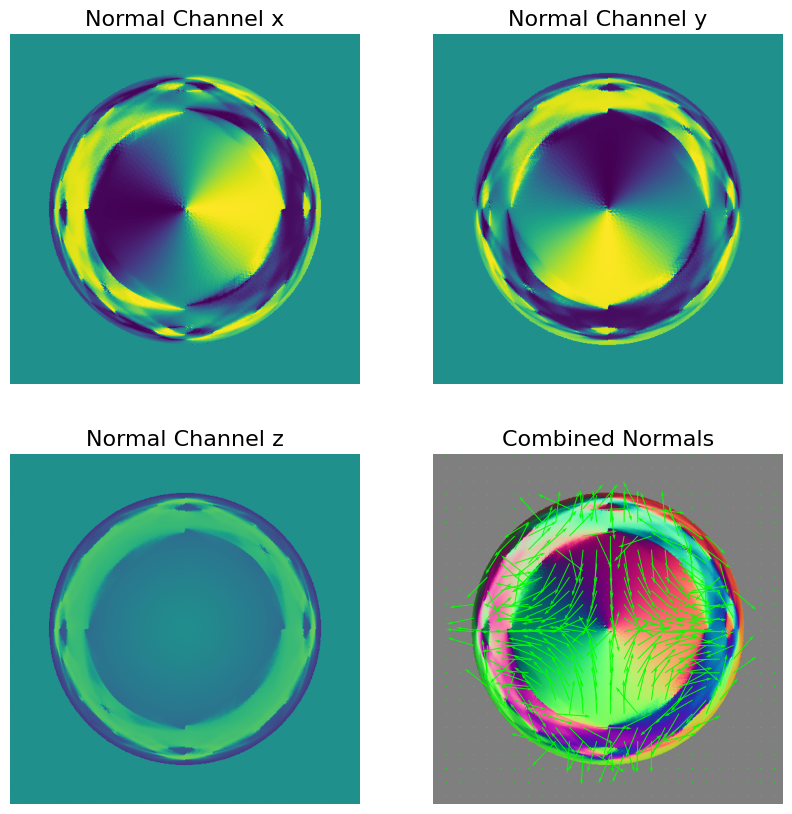

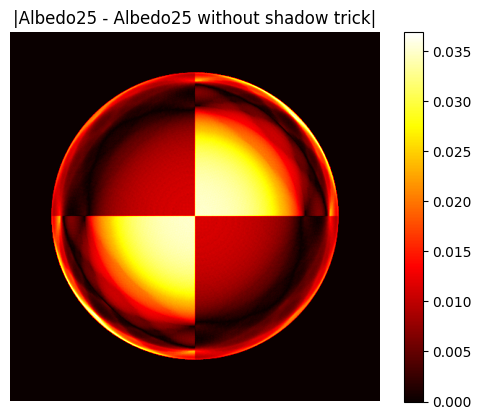

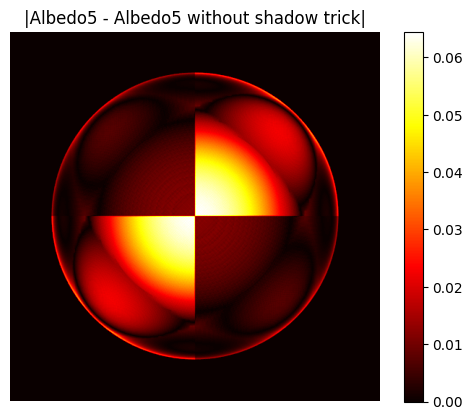

In [26]:
# build a normalized difference field from the two normal maps 
diff_field = normals_s5 - normals_5_no_shadow
diff_field /= (np.linalg.norm(diff_field, axis=2, keepdims=True) + 1e-8)
print("S5 normals: normalized difference (with shadow trick - without). ")
plot_surface_normals(diff_field)

diff_field = normals_s25 - normals_25_no_shadow
diff_field /= (np.linalg.norm(diff_field, axis=2, keepdims=True) + 1e-8)
print("S25 normals: normalized difference (with shadow trick - without). ")
plot_surface_normals(diff_field)

# -------------------------------------


# build a difference image from the two albedo maps
diff = albedo_s25 - albedo_25_no_shadow

plt.imshow(np.abs(diff), cmap='hot')
plt.title('|Albedo25 - Albedo25 without shadow trick|')
plt.axis('off')
plt.colorbar()
plt.show()

diff = albedo_s5 - albedo_5_no_shadow

plt.imshow(np.abs(diff), cmap='hot')
plt.title('|Albedo5 - Albedo5 without shadow trick|')
plt.axis('off')
plt.colorbar()
plt.show()


##### <font color='yellow'>Answer:</font>

> The shadow trick consists of multiplying the diagonal matrix ($\mathcal{I}$)  on both sides of the least squares equation: 
> $$\mathcal{I} \mathcal{V} \mathbf{g} = \mathcal{I} \mathbf{i}$$
> By doing this, we make sure that rows with close to zero intensity values (shadows) have a very small or null weight in the least squares solution. This in turn leads to a more robust estimate of g, and more stable albedo and normals, especially near the edge of the sphere.
>
> After removing the shadow trick for both the 5 and 25 images cases, we noticed that:
>
> For the 5 image case, using the shadow trick is very important, since we only have 5 equations per pixel, not down-weighting the shadows means that these few equations are more affected. Looking at the plots, the normals look very noisy and less smooth and the albedo is less uniform. 
>
> For the 25 image case, although the shadow trick helps, it doesn't have as strong of an effect since we have more equations per pixel (25 equations). Since the system is overdetermined, even without the shadow trick, we can still obtain good enough estimates of the albedo and normals. Consequently, the disparity for the difference maps for the 25 image case is smaller: In the difference plot for the albedo25 - albedo25 without shadow trick, the brightest value is around 0.035, while for the albedo5 - albedo5 without shadow trick, the brightest value is around 0.060. Overall, the albedo is more uniform and the normal maps looked slightly less smooth near the edges.
>
> 



<a id="question-20"></a>
#### <font color='#FF0000'>Question 20 (5 points)</font>

Before reconstructing the surface height map, it is necessary to compute the partial derivatives, $\frac{\partial f}{\partial x}$ and $\frac{\partial f}{\partial y}$ (referred to as *p* and *q* in the algorithm). These partial derivatives also allow for a double-check of the computation through a test of *integrability*.

In this question, you will need to complete the function `check_integrability()` to compute the partial derivatives *p* and *q*.

Make sure to verify your results by examining the integrability of the computed derivatives.

In [27]:
def check_integrability(normals):
    """
    Checks the surface gradient for integrability.

    This function computes the partial derivatives of the surface function with respect to x and y 
    (p and q), and calculates the squared errors of the mixed partial derivatives to test for integrability.

    Args:
        normals: The normal map of the surface.

    Returns:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        SE: The squared errors of the mixed partial derivatives.
    """

    # initialize p, q, and SE
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])

    # YOUR CODE HERE
    p = - np.where(normals[:, :, 2] != 0, normals[:, :, 0] / normals[:, :, 2], np.zeros_like(normals[:, :, 0]))
    q = - np.where(normals[:, :, 2] != 0, normals[:, :, 1] / normals[:, :, 2], np.zeros_like(normals[:, :, 1]))

    dp_dy = np.gradient(p, axis=0)
    dq_dx = np.gradient(q, axis=1)
    SE = (dp_dy - dq_dx) ** 2

    return p, q, SE

Showing the integrability check results for 5 light sources:
SE max: 1.1575454400510206
SE min: 3.7413229798925555e-38
SE median: 7.731116197791045e-07
Average SE: 0.0025954905119751396
Number of non-zero SE values: 262144


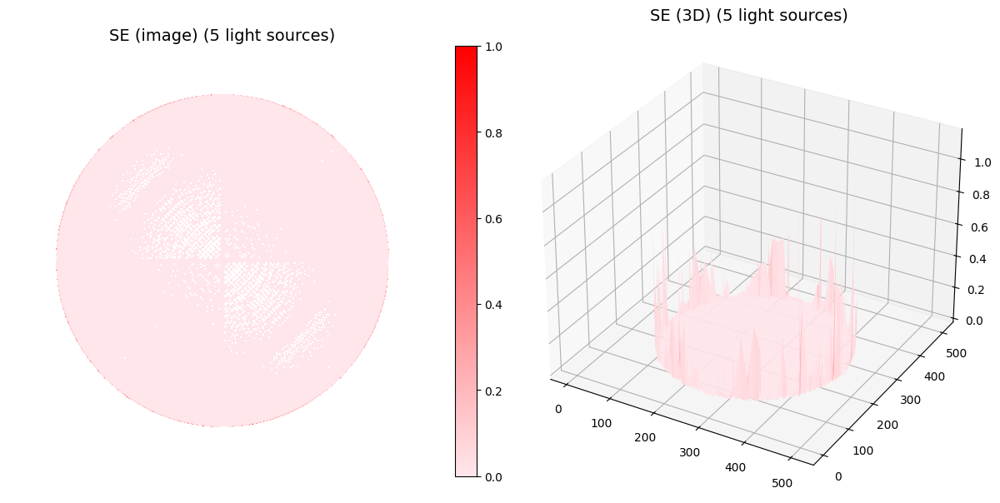

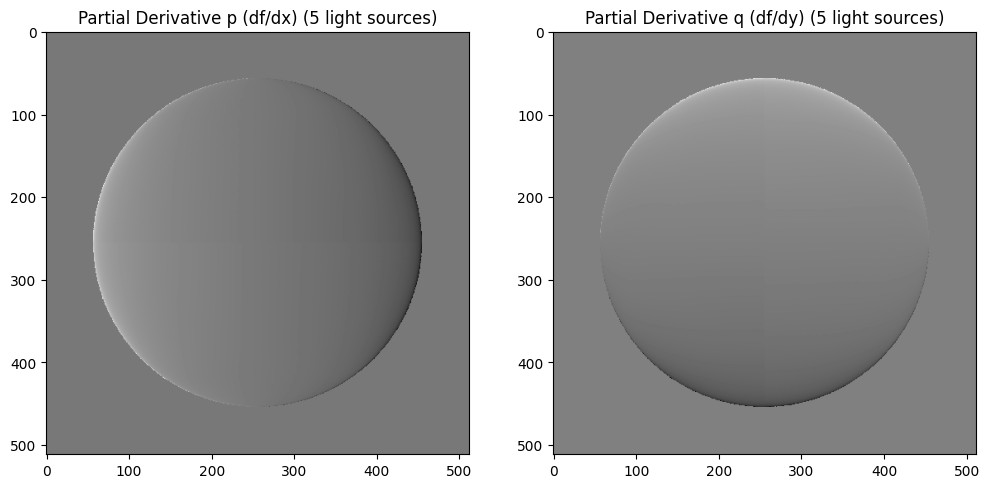

Showing the integrability check results for 25 light sources:
SE max: 0.8672454889034565
SE min: 1.2037062152420224e-35
SE median: 1.9625442603833246e-07
Average SE: 0.0011534549094159507
Number of non-zero SE values: 262144


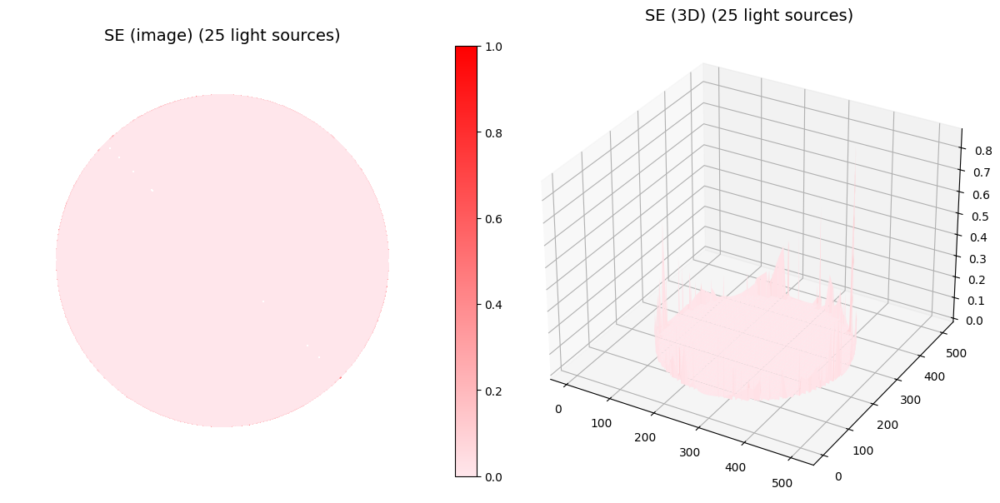

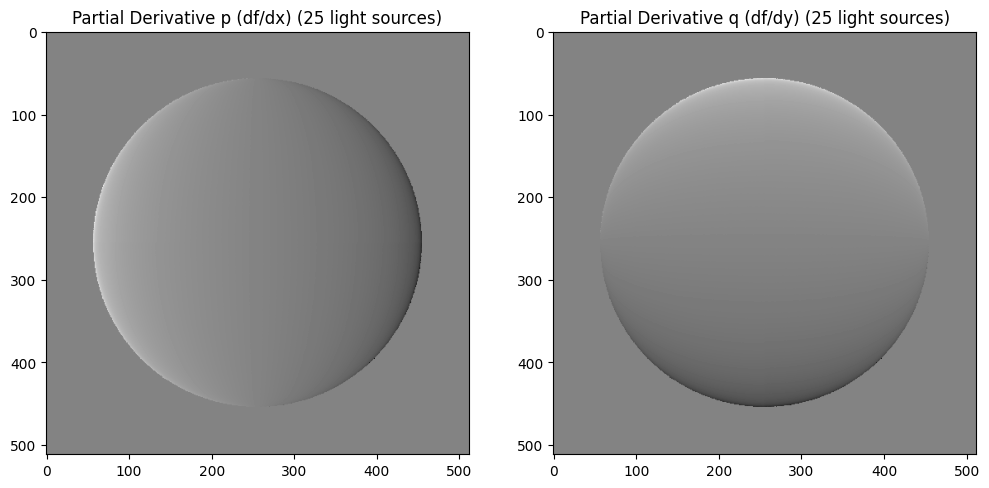

In [28]:
# Use the normals that you found in the previous question
p_s5, q_s5, SE_s5 = check_integrability(normals_s5)

SE_s5_analysis = SE_s5.copy()
SE_s5_analysis[SE_s5_analysis == 0] = np.nan  # ignore zeros in the analysis

print('Showing the integrability check results for 5 light sources:')
print(f'SE max: {np.nanmax(SE_s5_analysis)}')
print(f'SE min: {np.nanmin(SE_s5_analysis)}')
print(f"SE median: {np.nanmedian(SE_s5_analysis)}")
print(f"Average SE: {np.nanmean(SE_s5_analysis)}")
print(f"Number of non-zero SE values: {np.count_nonzero(SE_s5_analysis)}")

plot_SE(normals_s5, SE_s5, suffix="(5 light sources)")
plot_p_and_q(p_s5, q_s5, suffix="(5 light sources)")

p_s25, q_s25, SE_s25 = check_integrability(normals_s25)

SE_s25_analysis = SE_s25.copy()
SE_s25_analysis[SE_s25_analysis == 0] = np.nan  # ignore

print('Showing the integrability check results for 25 light sources:')
print(f'SE max: {np.nanmax(SE_s25_analysis)}')
print(f'SE min: {np.nanmin(SE_s25_analysis)}')
print(f"SE median: {np.nanmedian(SE_s25_analysis)}")
print(f"Average SE: {np.nanmean(SE_s25_analysis)}")
print(f"Number of non-zero SE values: {np.count_nonzero(SE_s25_analysis)}")

plot_SE(normals_s25, SE_s25, suffix="(25 light sources)")
plot_p_and_q(p_s25, q_s25, suffix="(25 light sources)")

<a id="question-21"></a>
#### <font color='#FF0000'>Question 21 (3 points)</font>

Implement and compute the partial derivatives according to the provided algorithm, and perform the test of integrability by applying a reasonable threshold to the squared errors. 

Reflect on the potential causes of any errors observed. Additionally, analyze how the test of integrability performs when using the GraySphere5 and GraySphere25 datasets. Use the normal maps obtained from the previous steps with the shadow trick applied.

S5 : tau=1.000e-04  violations: 3707/124449  (2.98%)
S25: tau=1.000e-04  violations: 1559/124449 (1.25%)



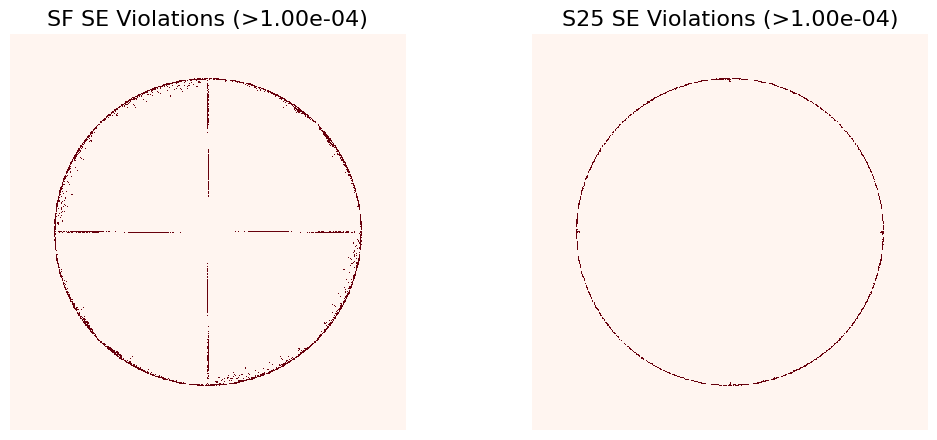

In [29]:
# Integrability (p, q, SE) for both normal maps
p5,  q5,  SE5  = check_integrability(normals_s5)
p25, q25, SE25 = check_integrability(normals_s25)

# Valid pixels (avoid rim where Nz ≈ 0)
valid5  = np.abs(normals_s5[..., 2])  > 1e-6
valid25 = np.abs(normals_s25[..., 2]) > 1e-6

# fixed threshold 
tau_fixed = 1e-4

viol5  = (SE5  > tau_fixed) & valid5
viol25 = (SE25 > tau_fixed) & valid25

# Count the outliers
n5, d5   = int(viol5.sum()),  int(valid5.sum())
n25, d25 = int(viol25.sum()), int(valid25.sum())

print(f"S5 : tau={tau_fixed:.3e}  violations: {n5}/{d5}  ({100.0*n5/d5:.2f}%)")
print(f"S25: tau={tau_fixed:.3e}  violations: {n25}/{d25} ({100.0*n25/d25:.2f}%)\n")

# --- Visualize ---
plt.close('all')
fig, ax = plt.subplots(1, 2, figsize=(11, 4.5))

ax[0].imshow(viol5,  cmap='Reds', interpolation='nearest')
ax[0].set_title(f'SF SE Violations (>{tau_fixed:.2e})', fontsize=16)
ax[0].axis('off')

ax[1].imshow(viol25, cmap='Reds', interpolation='nearest')
ax[1].set_title(f'S25 SE Violations (>{tau_fixed:.2e})', fontsize=16)
ax[1].axis('off')

plt.tight_layout()
plt.show()

##### <font color='yellow'>Answer:</font>

> Using the normals with the shadow trick applied from both the GraySphere5 and GraySphere25 cases, we computed the partial derivatives p and q, which were then used to compute the integrability error SE, where:
>$$
SE = \left( \frac{\partial p}{\partial y} - \frac{\partial q}{\partial x} \right)^2 
>$$
>
> We defined a fixed threshold (tau = $10^{-4}$) to make the comparison between the two cases fair, and counted the number of pixels where SE > threshold. 
>
> Potential causes of any errors observed:
>
> For the GraySphere5 dataset we found violations in the edges of the sphere and in the lines that separate the quadrants. For the GraySphere25 dataset, violations are only found in the edges of the sphere. 
>
> - The violations close to the edge of the sphere happen because near the silhouette the values for Nz are close to zero, so p = Nx/Nz and q = Ny/Nz become unstable and their mixed derivatives disagree. 
>
> - The violations in the lines that separate the quadrants are explained by the albedo discontinuity which causes the estimated normals to be slightly less accurate. The mixed-derivatives are very sensitive to this, which is why we have violations in these areas.
>
> The results showed that there were more violations/outliers in the GraySphere5 dataset compared to the GraySphere25 dataset (3707 > 1559). This was expected, since having more images means the system is more overdetermined and the estimations of g are better and more robust. Furthermore, since we use normals to compute the partial derivatives, p and q are smoother and mix better with each other, which leads to lower integrability errors SE.
> In conclusion, for a fixed threshold, the integrability test performs better when using the GraySphere25.


<a id="question-22"></a>
#### <font color='#FF0000'>Question 22 (6 points)</font>

To reconstruct the surface height map, you need to integrate the partial derivatives over a path. Since we are working with discrete structures, this integration is done by summing their values.

The algorithm presented in the chapter suggests performing the integration in a column-major order: start at the top-left corner, integrate along the first column, and then proceed to the right along each row. However, it is also recommended to use multiple paths and average the results to help distribute the errors from derivative estimates.

In this question, you will:

1. Construct the surface height map using column-major order as described in the algorithm.
2. Implement the row-major path integration method.

Your implementation should be added to the `construct_surface()` function.

**Note**: By default, Numpy uses row-major operations. If you unroll an image to linearize the operation, you will end up with a row-major representation. Numpy can be configured to use column-major order, but this concern does not apply if you are using double for-loops without unrolling.

**Hint**: To further inspect the shape of the objects and normal directions, consider using the `matplotlib.pyplot.quiver` function. Be sure to choose appropriate sub-sampling ratios for proper illustration. Add this to the `show_results()` function if needed.

In [30]:
def construct_surface(p, q, path_type='column'):
    """
    Constructs the surface function represented as height_map.

    This function integrates the partial derivatives p and q to reconstruct the surface height map.
    The integration can be done along a column-major, row-major, or an averaged path.

    Args:
        p: The partial derivative of the surface function with respect to x (df/dx).
        q: The partial derivative of the surface function with respect to y (df/dy).
        path_type: The type of path to construct the height_map, either 'column', 'row', or 'average'.

    Returns:
        height_map: The reconstructed surface height map.
    """

    h, w = p.shape
    height_map = np.zeros([h, w])

    if path_type == 'column':
        # Integrate along the first column
        for j in range(1, h):
            height_map[j, 0] = height_map[j - 1, 0] + q[j, 0]

        for j in range(h):
            for i in range(1, w):
                height_map[j, i] = height_map[j, i - 1] + p[j, i]

    elif path_type == 'row':
        # Integrate along the first row
        for i in range(1, w):
            height_map[0, i] = height_map[0, i - 1] + p[0, i - 1]

        for i in range(w):
            for j in range(1, h):
                height_map[j, i] = height_map[j - 1, i] + q[j, i]

    elif path_type == 'average':
        height_map_col = construct_surface(p, q, path_type='column')
        height_map_row = construct_surface(p, q, path_type='row')

        height_map = (height_map_col + height_map_row) / 2

    return height_map

Showing the surface reconstruction results for 5 light sources using column-major integration:


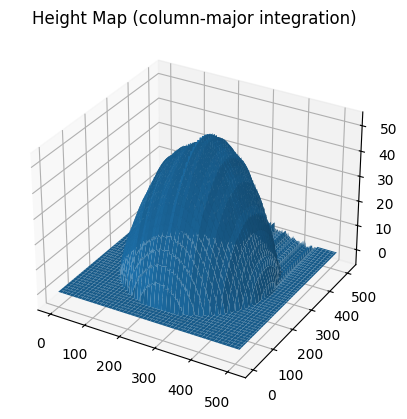

Showing SE (values > threshold = 1.0e-04)


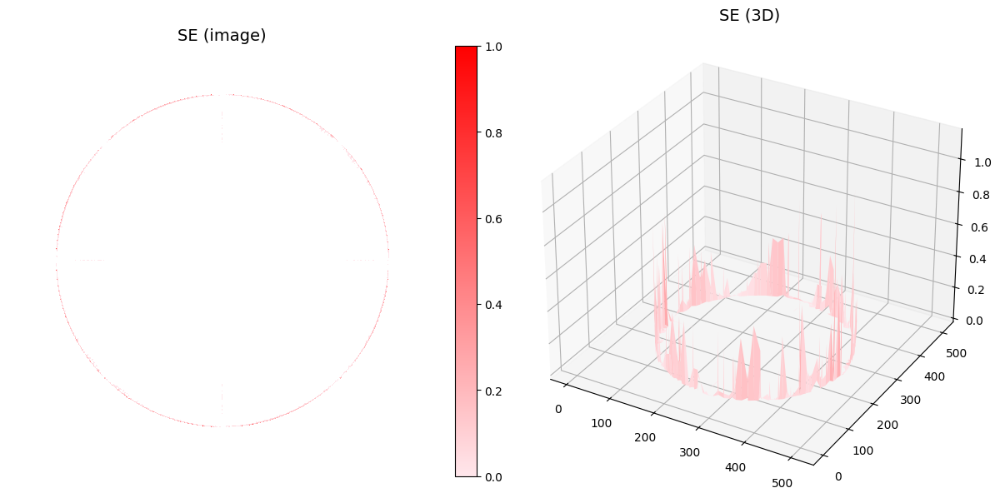

In [31]:
p, q, SE = check_integrability(normals_s5)

height_map = construct_surface(p, q, "column")

threshold = 1e-4
SE_masked = SE.copy()
SE_masked[SE_masked <= threshold] = np.nan  

print('Showing the surface reconstruction results for 5 light sources using column-major integration:')
plot_height_map(height_map, stride=1, suffix="(column-major integration)")

print(f'Showing SE (values > threshold = {threshold:.1e})')
plot_SE(normals_s5, SE_masked, stride=1)




<a id="question-23"></a>
#### <font color='#FF0000'>Question 23 (2 points)</font>

Compare the results obtained from the two different integration paths (column-major and row-major). 

What are the differences in the reconstructed surface height maps when using these two paths? Discuss any observations you notice between the two approaches.

Showing the surface reconstruction results for 5 light sources using row-major integration:


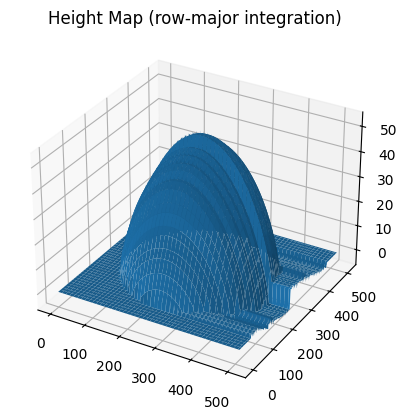

Showing SE (values > threshold = 1.0e-04)


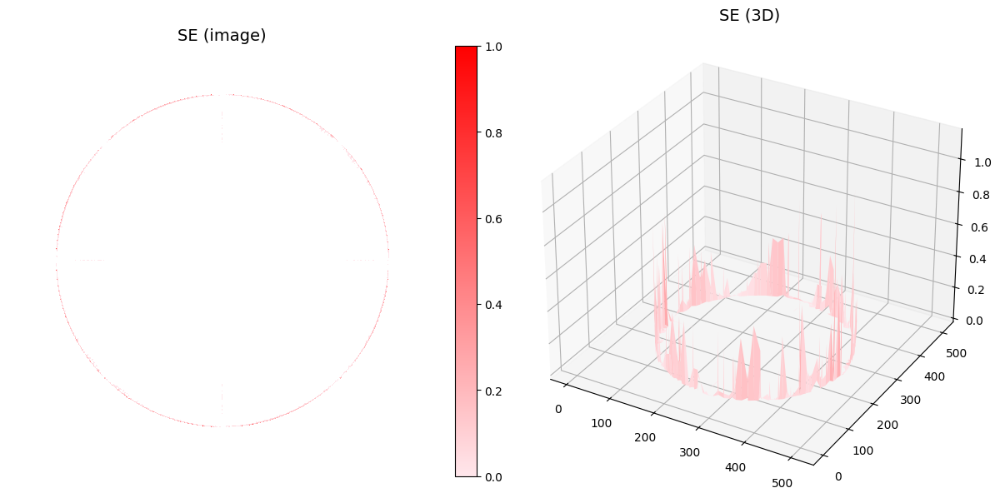

In [32]:
p, q, SE = check_integrability(normals_s5)

height_map = construct_surface(p, q, "row")

threshold = 1e-4
SE_masked = SE.copy()
SE_masked[SE_masked <= threshold] = np.nan  

print('Showing the surface reconstruction results for 5 light sources using row-major integration:')
plot_height_map(height_map, stride=1, suffix="(row-major integration)")

print(f'Showing SE (values > threshold = {threshold:.1e})')
plot_SE(normals_s5, SE_masked, stride=1)


##### <font color='yellow'>Answer:</font>

> When comparing the plots from the column-major and row-major integration paths, we observed that both methods produced similar overall shapes (both produced a spherical cap) of the reconstructed surface height maps. 
>
> However, there are some differences:
>
> - When integrating using the column major, we go down the first column with q, then across each row with p. When we find an error in the first column, this error propagates across the entire row, leading to horizontal streaks in the height map. These streaks are called row-wise ridges.
> 
> - When integrating using the row major, we go across the first row with p, then go down each column with q. When we find an error in the first row, this error propagates down the entire column, leading to vertical streaks in the height map. These streaks are called column-wise ridges.
>
> This can be seen clearly in the height map plots. For the row/major integration, the direction of the integration is vertically from the top to the bottom, while for the column-major integration, the direction of the integration is horizontally from left to right.
>
> The SE plots look identical, showing integrability errors only in the silhouette of the sphere. The two SE plots are identical because selecting row or column-major integration only affects the height map and not p and q (therefore SE is not affected).  
>
>


<a id="question-24"></a>
#### <font color='#FF0000'>Question 24 (2 points)</font>

Now, take the average of the results obtained from the column-major and row-major integration paths.

Do you observe any improvement compared to using only one path? Additionally, analyze whether the construction results vary when using different numbers of images in the reconstruction process. (So compare the results obtained from the GraySphere5 and GraySphere25 datasets.)

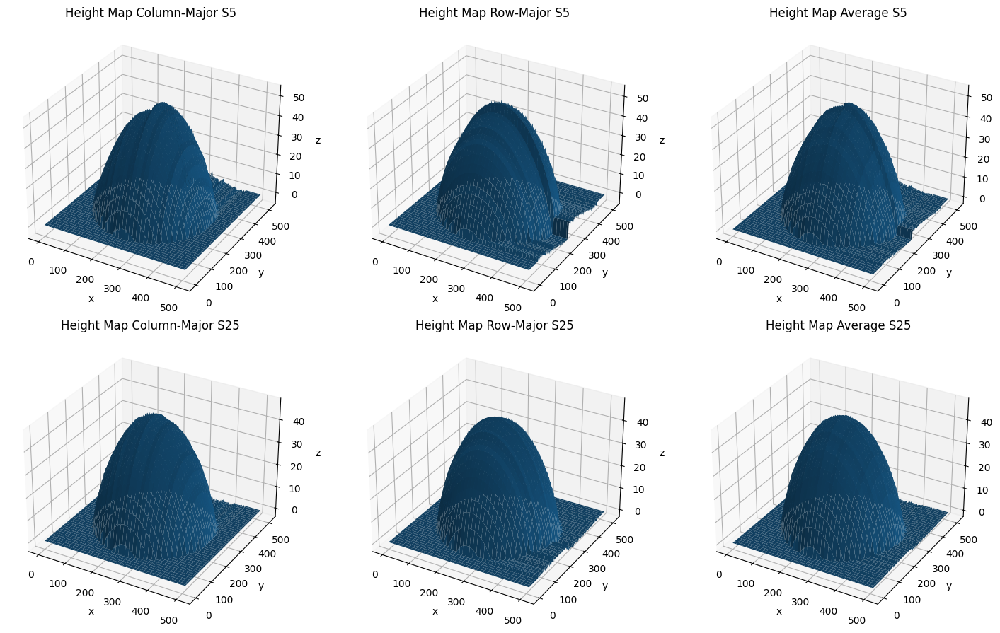

In [33]:
# p, q for each dataset
p5,  q5,  _ = check_integrability(normals_s5)
p25, q25, _ = check_integrability(normals_s25)

# S5 height maps 
hm5_col = construct_surface(p5,  q5,  "column")
hm5_row = construct_surface(p5,  q5,  "row")
hm5_avg = construct_surface(p5,  q5,  "average")

# S25 height maps 
hm25_col = construct_surface(p25, q25, "column")
hm25_row = construct_surface(p25, q25, "row")
hm25_avg = construct_surface(p25, q25, "average")


def plot_hm(ax, height_map, title, stride=2):
    H, W = height_map.shape
    X, Y = np.meshgrid(np.arange(0, H, stride), np.arange(0, W, stride), indexing='ij')
    Z = height_map[::stride, ::stride]
    ax.plot_surface(X, Y, Z, linewidth=0)
    ax.set_title(title)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')


fig = plt.figure(figsize=(15, 9))

axs = [
    fig.add_subplot(2, 3, 1, projection='3d'),
    fig.add_subplot(2, 3, 2, projection='3d'),
    fig.add_subplot(2, 3, 3, projection='3d'),
    fig.add_subplot(2, 3, 4, projection='3d'),
    fig.add_subplot(2, 3, 5, projection='3d'),
    fig.add_subplot(2, 3, 6, projection='3d'),
]

# Row 1: S5
plot_hm(axs[0], hm5_col, "Height Map Column-Major S5")
plot_hm(axs[1], hm5_row, "Height Map Row-Major S5")
plot_hm(axs[2], hm5_avg, "Height Map Average S5")

# Row 2: S25
plot_hm(axs[3], hm25_col, "Height Map Column-Major S25")
plot_hm(axs[4], hm25_row, "Height Map Row-Major S25")
plot_hm(axs[5], hm25_avg, "Height Map Average S25")

plt.tight_layout()
plt.show()


##### <font color='yellow'>Answer:</font>

> GraySphere5 dataset:
> 
> - After taking the average of the column-major and row-major integration paths, we observed that the averaged height map looked smoother compared to using only one path. But, we could still see some ridges in the height map, especially around the silhouette. This happens because when using 5 images, errors in p and q are more significant, which leads to more noticeable ridges in the height map.
> 
> GraySphere25 dataset:
>
> - After taking the average of the column-major and row-major integration paths, we observed that the height map looked much smoother and the ridges were significantly reduced. For this dataset the improvements were more noticeable, not only for the averaged height map, but also for the column-major and row-major height maps. This happens because when using 25 images, errors in p and q have less impact, which leads to more consistent integration. 
>
> In conclusion, for both datasets the averaged height map showed better results compared to using only one integration path. Furthermore, the height maps from the GraySphere25 dataset were much smoother than the corresponding height maps from the GraySphere5 dataset. Finally, the smoothest height map was the averaged height map from the GraySphere25 dataset. This all leads to the conclusion that using more images and choosing an averaging integration path leads to smoother and better height maps.

<a id="question-25"></a>
#### <font color='#FF0000'>Question 25 (3 points)</font>

Run the photometric stereo algorithm on the MonkeyGray model using the `photometric_stereo` function and display the results. Complete the provided code, execute the algorithm, and show the outcomes.

In [35]:
def photometric_stereo(
    image_dir='./photometrics_images/MonkeyGray/',
    original_image_path="./photometrics_images/MonkeyGray/Monkey_0.0_0.0.png",
    shadow_trick=False,
    threshold=0.0001,
    suffix="",
    plotting_fn=None,
):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for a given set of images under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/MonkeyGray/').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_synthetic_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of images and light source matrix
    print('Computing surface albedo and normal map...\n')

    
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=shadow_trick)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    
    p, q, SE = check_integrability(normals)

    
    threshold = threshold

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    print(f"Percentage of outliers: {np.mean(SE > threshold) * 100:.2f}%\n")
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height
    print('Computing surface height map...\n')

    
    height_map = construct_surface(p, q, path_type='average')

    # show results
    print('Displaying results...\n')

    
    if plotting_fn is not None:
        plotting_fn(albedo, normals, suffix=suffix, original_image_path=original_image_path, height_map=height_map, SE=SE, stride=1)
    else:
        show_results(albedo, normals, suffix=suffix, original_image_path=original_image_path, height_map=height_map, SE=SE, stride=1)

If you estimate the albedo and surface normal for MonkeyGrat, the cell below will run for at least 20 seconds.

Loading images...

image size (h*w): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 30983

Percentage of outliers: 11.82%

Computing surface height map...

Displaying results...



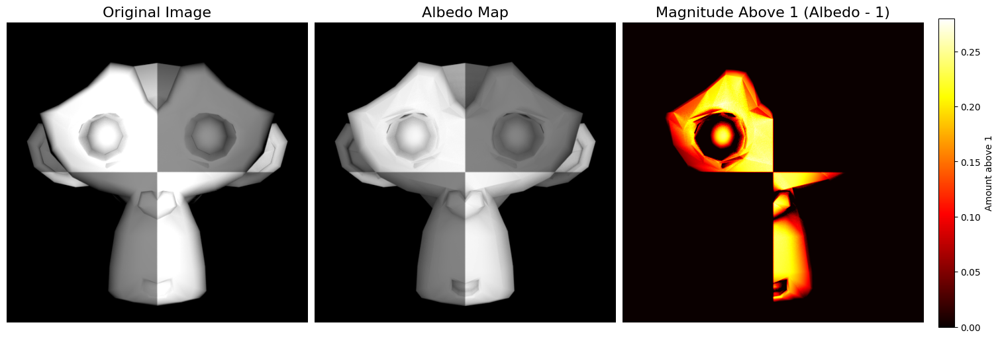

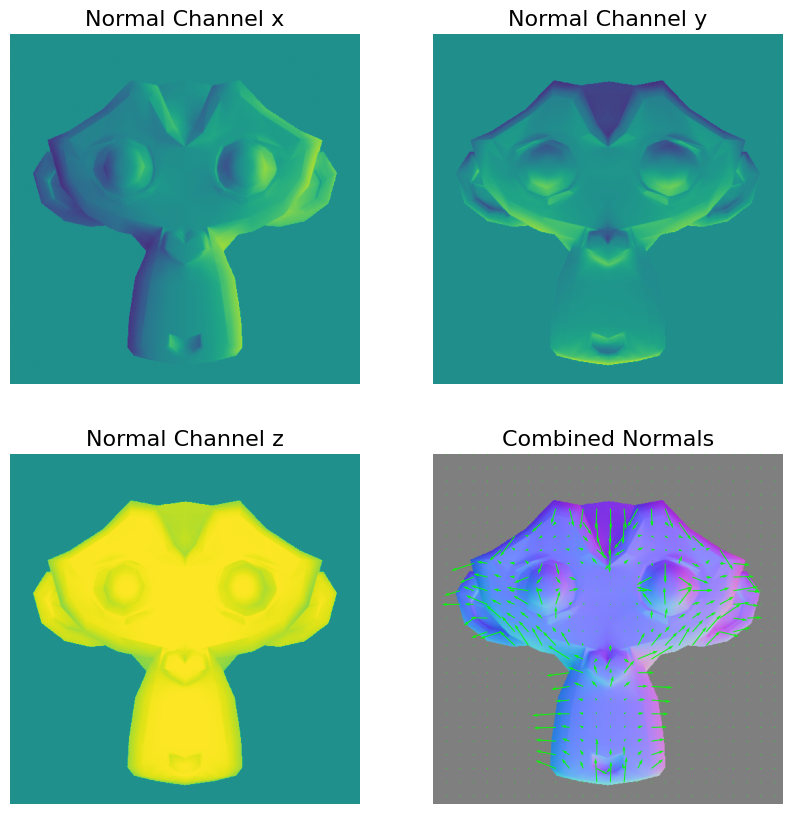

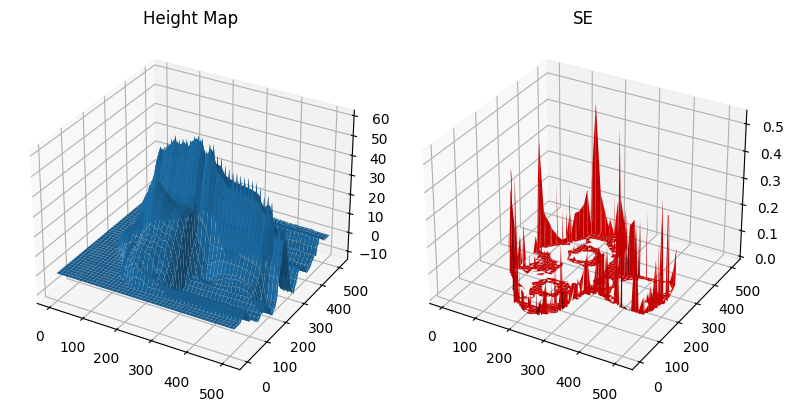

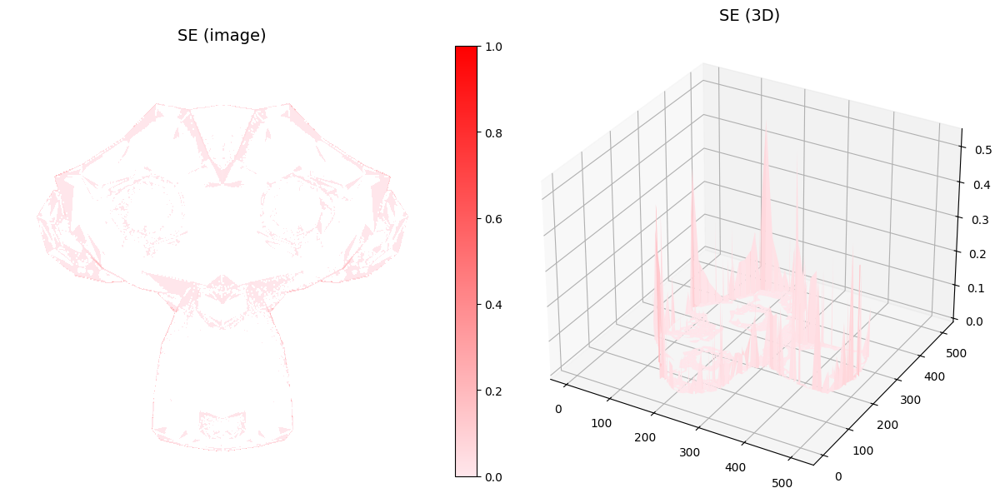

In [36]:
# Use the function
image_dir = './photometrics_images/MonkeyGray/'
photometric_stereo(image_dir)

<a id="question-26"></a>
#### <font color='#FF0000'>Question 26 (2 points)</font>

The albedo results for the MonkeyGray model may exhibit more errors (SE) compared to the sphere. Observe and describe the errors (SE) that arise when running the photometric stereo algorithm on the MonkeyGray model.

What could be the reasons for these errors? Experiment with different numbers of images, as you did in Question 15 and Question 18, to see the effects and discuss your observations.

##### <font color='yellow'>Answer:</font>

> When comparing the monkey model to the sphere, the squared errors are noticeably higher for the monkey model. This is mainly due to the more complex geometry of the monkey. While the sphere is smooth and only exhibits large errors near the borders where the normals are close to perpendicular to the camera, the monkey has many regions with such orientations. For example, around the eyes, nose, and mouth. These areas introduce additional error beyond just the borders. The overall shape complexity therefore increases sensitivity to lighting and causes more variation in the error distribution.

<a id="question-27"></a>
#### <font color='#FF0000'>Question 27 (2 points)</font>

Considering the errors observed in the albedo results for the MonkeyGray model, what do you think could help in reducing or solving these errors? Provide your thoughts on potential strategies or methods that might improve the accuracy of the results.

##### <font color='yellow'>Answer:</font>

> Adding more images with **missing** lighting conditions. This could translated to more pronunciated angles or taking pictures with a smaller angle delta (rate at which light sources change). The hypothesis behind this is that shadow information might not be rich enough for the linear system to solve smoothly for every point. Meaning, for every existing shadow pixel, there must be a set of images for which that pixel is not in a shadow, and the set is large enough for the linear system to properly estimate the albedo for it. If this holds, could decrease the squared errors. This approach, however, is limited to some degree by the perpendicular normals in certain of the shape and the size of the image.

<a id="question-28"></a>
#### <font color='#FF0000'>Question 28 (5 points)</font>

So far, we have assumed that albedos and input images are 1-channel grayscale images. To work with 3-channel RGB images, a simple approach is to split the input image into separate channels and treat them individually. However, this method may introduce issues when constructing the surface normal map if a pixel value in a channel is zero.

Update the implementation to work with 3-channel RGB inputs. Complete the functions `load_synthetic_images_rgb` and `estimate_albedo_and_normals_rgb ` to handle RGB images, and test your updated implementation with the SphereColor and MonkeyColor models using the `photometric_stereo_rgb` function. Make sure to display the results.

In [37]:
def load_synthetic_images_rgb(image_dir):
    """
    Loads synthetic RGB images and light directions.

    This function reads images from the specified directory, processes each color channel separately, 
    and stacks them together along with their corresponding light directions.

    Args:
        image_dir: Path to the directory containing the images.

    Returns:
        A tuple containing the image stack and the light directions.
    """

  
    return load_synthetic_images(image_dir, color_type="rgb")

In [38]:
def estimate_albedo_and_normals_rgb(image_stack, scriptV, shadow_trick=True):
    """
    Estimates albedo and normals from a stack of RGB images and light directions.

    This function processes each color channel separately to estimate the albedo and normal maps.
    The results from each channel are then combined to produce the final albedo and normal maps.

    Args:
        image_stack: Image stacks for each color channel.
        scriptV: Light directions for each color channel.
        shadow_trick: Whether or not to use the shadow trick. Defaults to True.

    Returns:
        A tuple containing the albedo and normal maps.
    """

    # Estimate albedo for each channel
    albedo_r, normals_r = estimate_albedo_and_normals(image_stack[:, :, 0, :], scriptV, shadow_trick)
    albedo_g, normals_g = estimate_albedo_and_normals(image_stack[:, :, 1, :], scriptV, shadow_trick)
    albedo_b, normals_b = estimate_albedo_and_normals(image_stack[:, :, 2, :], scriptV, shadow_trick)

    # Combine albedo channels
    albedo = (albedo_r + albedo_g + albedo_b) / 3

    # Combine normals by averaging
    normals = (normals_r + normals_g + normals_b) / 3
    norms = np.linalg.norm(normals, axis=2, keepdims=True)
    normals = np.where(norms != 0, normals / norms, np.zeros_like(normals))  # Normalize normals

    return albedo, normals

In [39]:
def photometric_stereo_rgb(
    image_dir='./SphereColor/',
    original_image_path="./photometrics_images/SphereColor/Sphere_0.0_0.0.png",
    shadow_trick=False,
    threshold=0.0001,
    suffix="",
    plotting_fn=None,
):
    """
    Performs photometric stereo on RGB images to estimate the surface albedo, normals, and height map.

    This function loads RGB images from the specified directory, computes the surface albedo and 
    normal maps, checks integrability, reconstructs the surface height map, and displays the results.

    Args:
        image_dir: Path to the directory containing the images.
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    image_stack, scriptV = load_synthetic_images_rgb(image_dir)
    h, w, c, n = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

   
    albedo, normals = estimate_albedo_and_normals_rgb(image_stack, scriptV, shadow_trick=shadow_trick)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

  
    p, q, SE = check_integrability(normals)

   
    threshold = threshold

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

 
    height_map = construct_surface(p, q, path_type='average')

    # show results
    print('Displaying results...\n')

  
    if plotting_fn is not None:
        plotting_fn(albedo, normals, suffix=suffix, original_image_path=original_image_path, height_map=height_map, SE=SE, stride=1)
    else:
        show_results(albedo, normals, suffix=suffix, original_image_path=original_image_path, height_map=height_map, SE=SE, stride=1)

If you estimate the albedo and surface normal for SphereColor and MonkeyColor, the cell below will run for atleast 1 or 2 minutes.

Loading images...

image size (h*w): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 27374

Computing surface height map...

Displaying results...



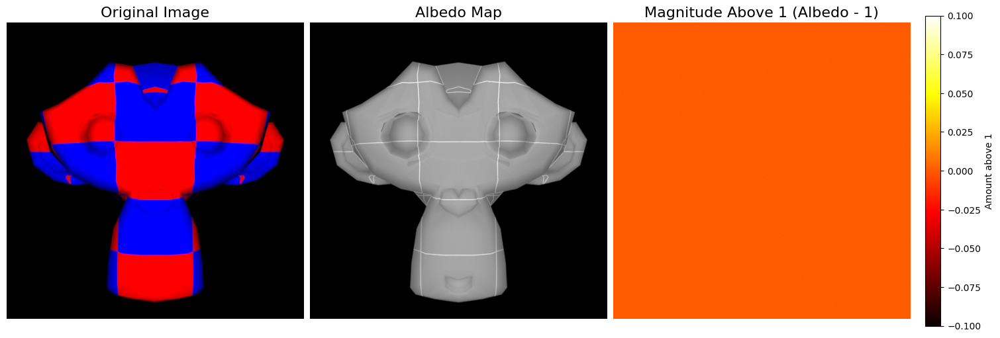

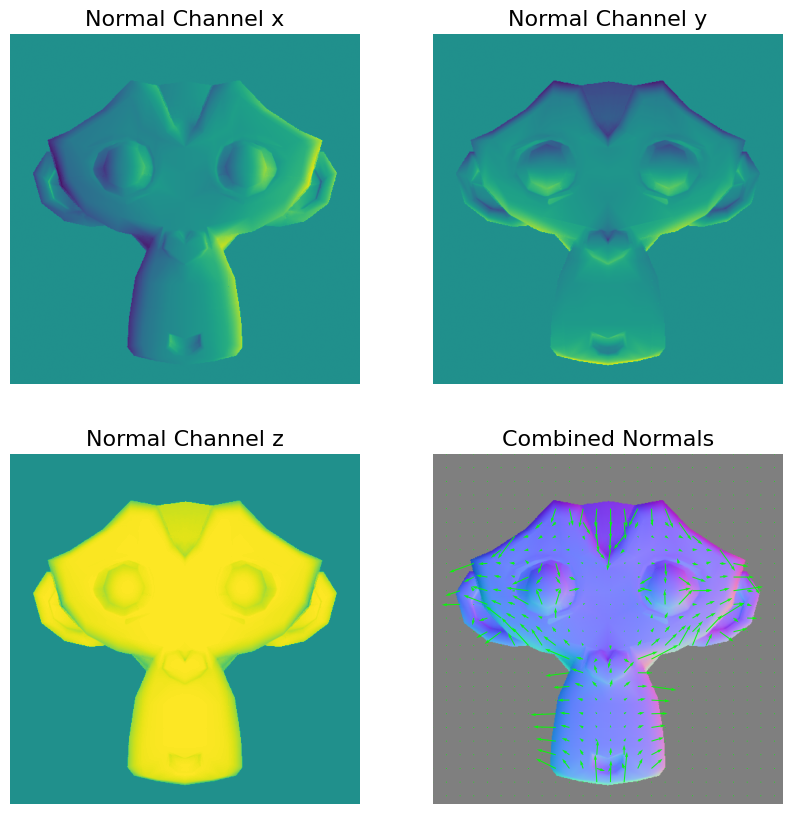

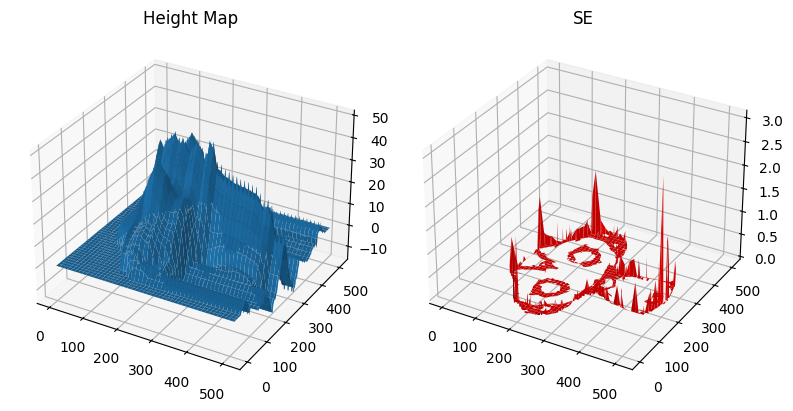

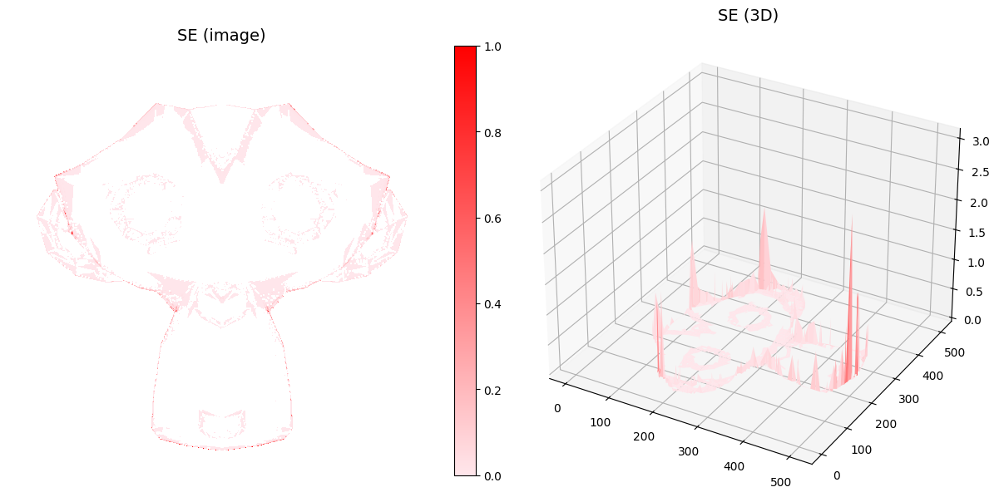

In [40]:

photometric_stereo_rgb(
    './photometrics_images/MonkeyColor/',
    original_image_path="./photometrics_images/MonkeyColor/Monkey_0.0_0.0.png",
    shadow_trick=True
)

Loading images...

image size (h*w): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 9485

Computing surface height map...

Displaying results...



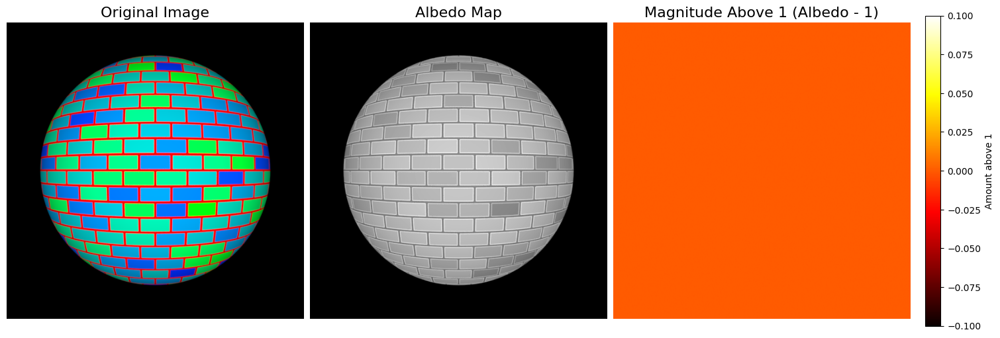

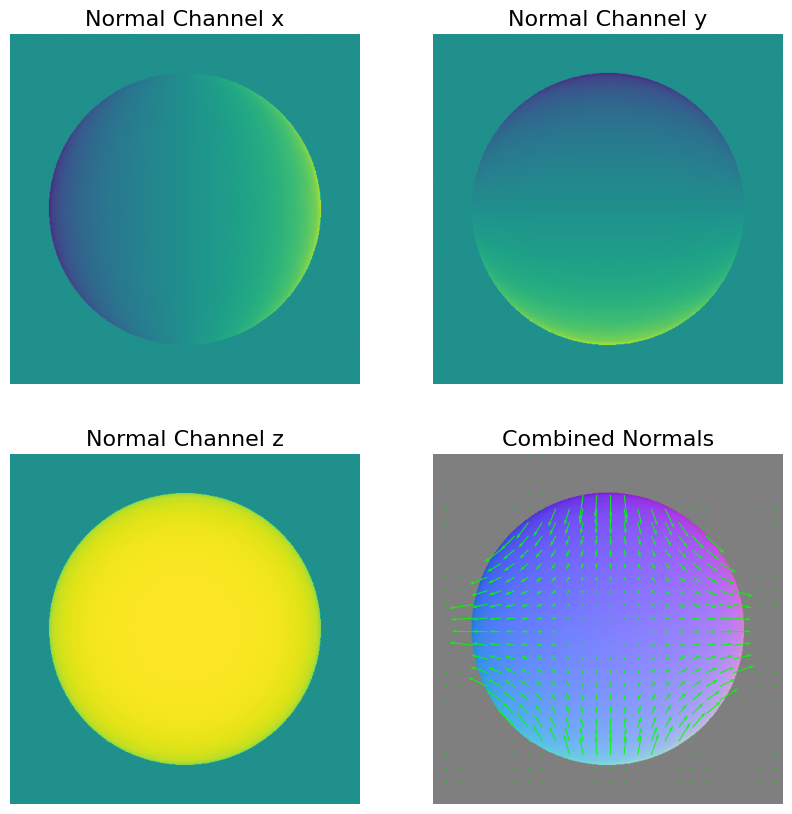

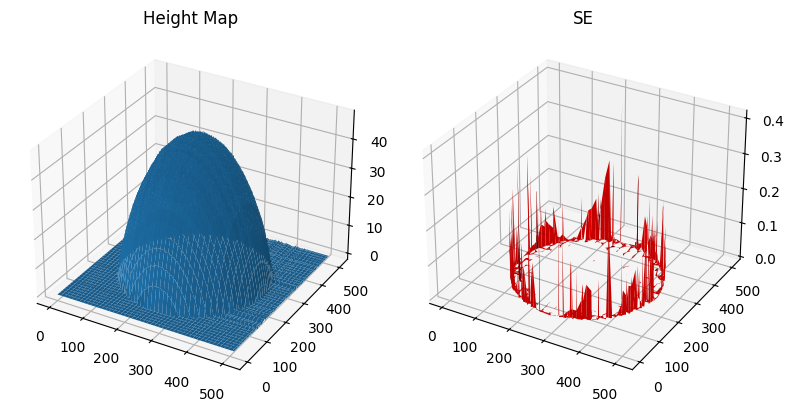

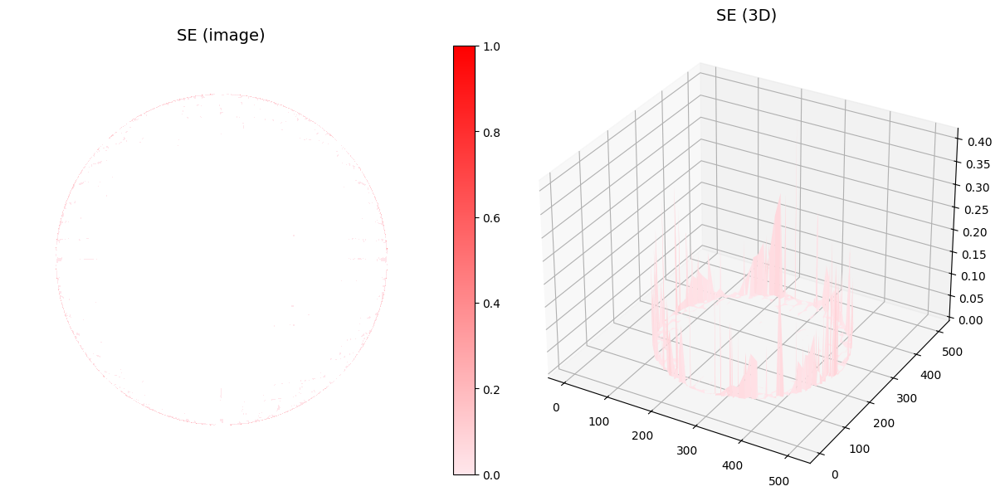

In [41]:

photometric_stereo_rgb(
    './photometrics_images/SphereColor/',
    original_image_path="./photometrics_images/SphereColor/Sphere_0.0_0.0.png",
    shadow_trick=True
)

<a id="question-29"></a>
#### <font color='#FF0000'>Question 29 (2 points)</font>

Explain the changes made to the function and discuss the results of these changes.

##### <font color='yellow'>Answer:</font>

> For the RGB case, we modified the code to load all three color channels and added an extra channel dimension to `image_stack` to store them. The albedo and normals were then computed per channel (as instructed in the function's docstring) and averaged across channels. The normals where then normalized to obtain unit vectors.
>
> This approach produced improved results: the albedo maps do not violate the `albedo <= 1` condition, and the sphere’s height map was the best reconstruction so far. Averaging across color channels seems to smooth outliers across channels, providing a more accurate surface.
>
> This represents a trade-off when comparing with using a single grayscale channel. Averaging different signals yields better results, however, processing a single channels has lower computational cost. This relates to results found on integration paths later.

<a id="question-30"></a>
#### <font color='#FF0000'>Question 30 (2 points)</font>

Observe the problem in the constructed surface normal map and height map. Explain why a zero pixel could be a problem and propose a way to overcome that.

##### <font color='yellow'>Answer:</font>

> Regarding zero pixels: in theory, a zero pixel can cause issues because it provides no useful intensity information and may introduce ambiguity when solving the linear system for albedo or normals.
>
> A way to mitigate this would be to ignore zero-valued pixels during estimation (using shadow trick for each channel, as we do). Additionally, averaging across channels may mitigate certain instabilities present in individual channels, making the results smoother.

<a id="question-31"></a>
#### <font color='#FF0000'>Question 31 (4 points)</font>

Now, it's time to apply the algorithm to real-world datasets. We will first use the Yale Face Database.

For the Face dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Run the algorithm for the Yale Face images: [Yale Face Database](http://cvc.cs.yale.edu/cvc/projects/yalefaces/yalefaces.html). The Yale face data is included in the lab material. The `load_face_images` function is provided as a helper. You should complete the `photometric_stereo_face_dataset` function as part of this task.

Make sure to display the results for the Face dataset using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

**Hint**: For proper computation of albedo and surface normal, you may want to suspend the shadow trick described in the text, and use the original formula:
$$i = Vg(x,y)$$

In [42]:
def load_face_images(image_dir='./photometrics_images/yaleB02', bad_images=[]):
    """
    Loads a set of face images from the Yale Face Database and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """
    
    # define the number of images to load
    num_images = 64
    
    # load the ambient image (the image without any lighting)
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    
    # get the height and width of the ambient image
    h, w = ambient_image.shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the yaleB02 face dataset
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths
    filenames = [os.path.basename(x) for x in d]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        if filenames[j] in bad_images:
            continue  # skip bad images

        # extract the lighting angles from the filename
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        
        # load the image and subtract the ambient image to get the actual illumination effect
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image

    # calculate the light direction vectors based on the extracted angles
    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    
    # combine the direction vectors, adjusting for normal direction
    scriptV = [-1,-1,1] * np.array([y,z,x]).transpose(1,0)

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack<0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [43]:
def photometric_stereo_face_dataset(
    image_dir='./photometrics_images/yaleB02',
    original_image="./photometrics_images/yaleB02/yaleB02_P00A+000E+00.pgm",
    shadow_trick=False,
    path_type='average',
    threshold=0.0001,
    plotting_fn=None,
    suffix=None,
):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './images/photometrics_images/yaleB02/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')

    
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=shadow_trick)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    
    p, q, SE = check_integrability(normals)

    
    threshold = threshold

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    print(f"Percentage of outliers : {np.mean(SE > threshold) * 100:.2f}%\n")
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    
    height_map = construct_surface(p, q, path_type=path_type)

    # show results
    print('Displaying results...\n')

    
    if plotting_fn is not None:
        plotting_fn(albedo=albedo, normals=normals, suffix=suffix, original_image_path=original_image, height_map=height_map, SE=SE, stride=1)
    else:
        show_results(albedo, normals, suffix=suffix, original_image_path=original_image, height_map=height_map, SE=SE, stride=1)

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 10 seconds.

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 18107

Percentage of outliers : 56.14%

Computing surface height map...

Displaying results...



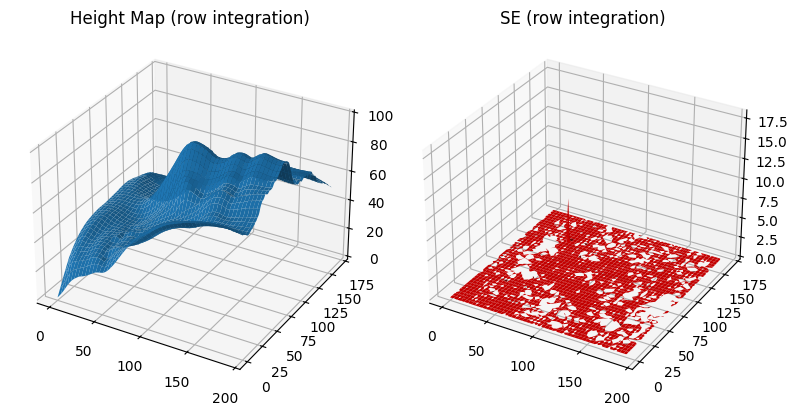

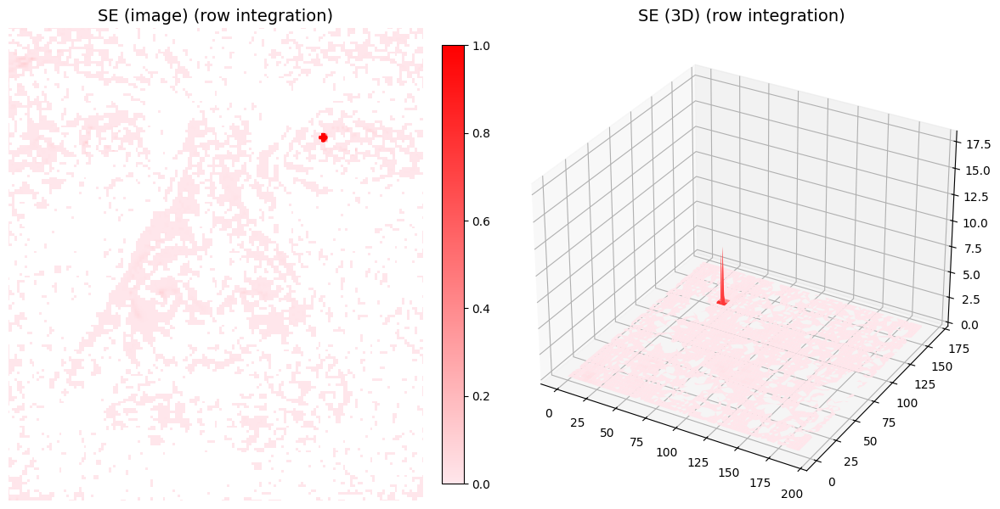

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 18107

Percentage of outliers : 56.14%

Computing surface height map...

Displaying results...



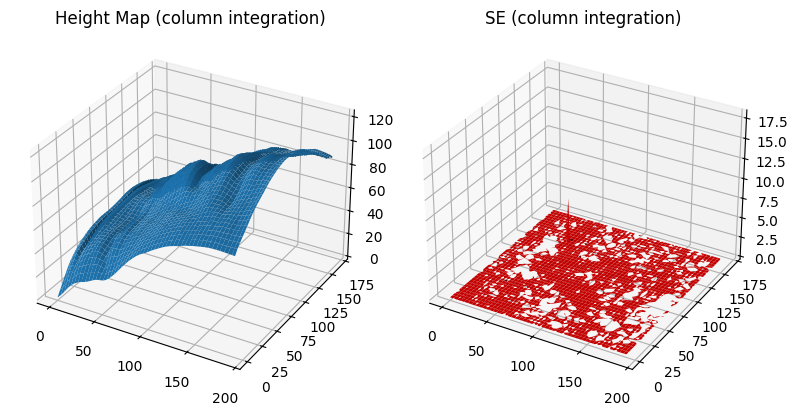

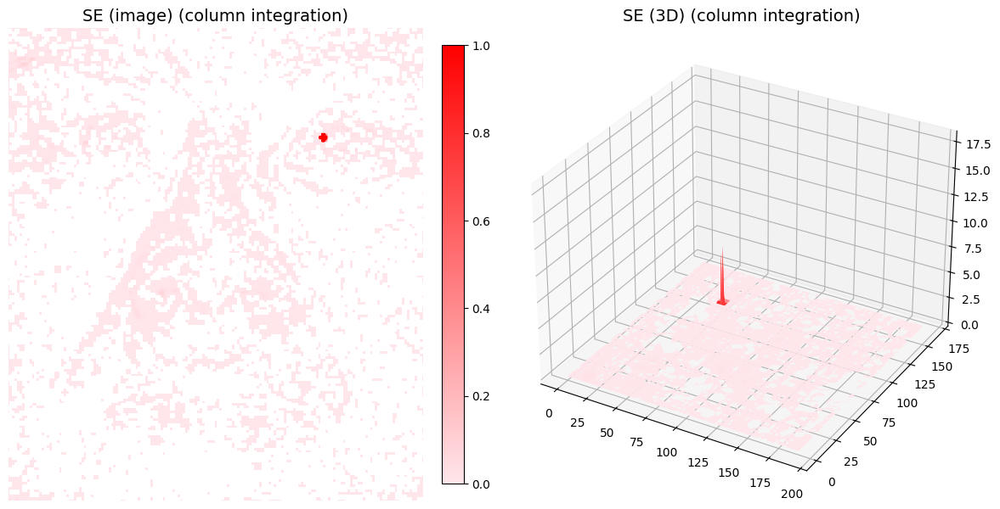

Loading images...

Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 18107

Percentage of outliers : 56.14%

Computing surface height map...

Displaying results...



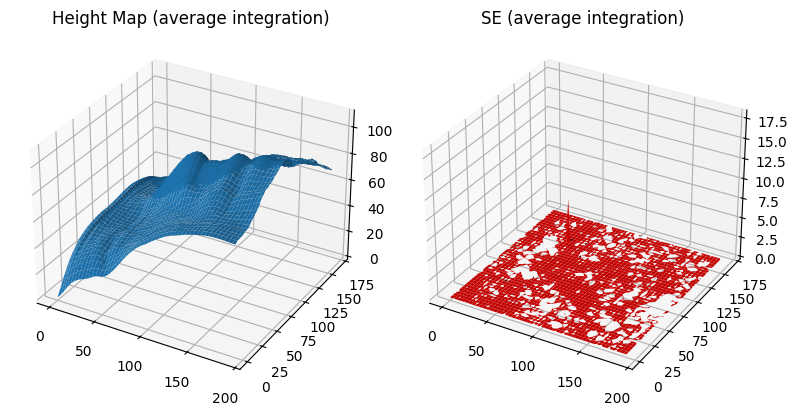

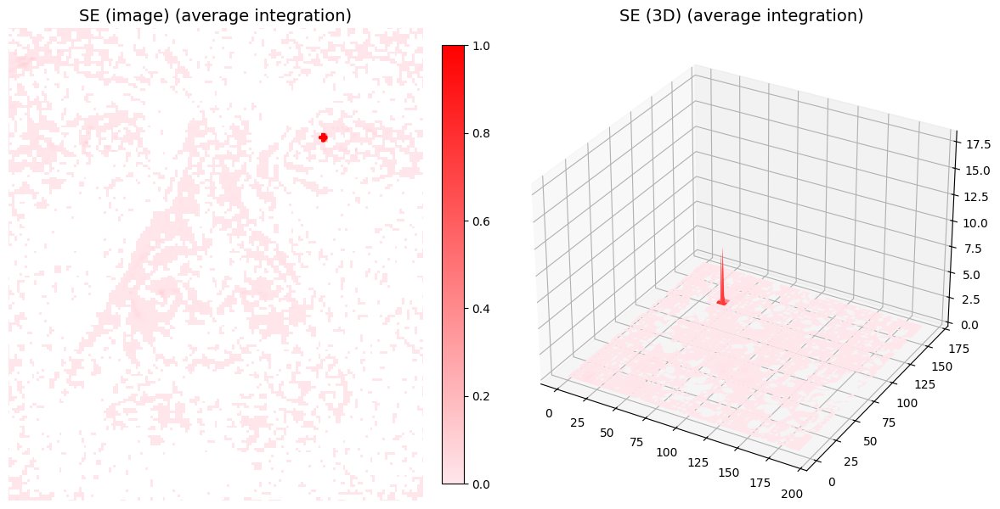

In [44]:

photometric_stereo_face_dataset(path_type="row", plotting_fn=plot_height_map, suffix="(row integration)")

photometric_stereo_face_dataset(path_type="column", plotting_fn=plot_height_map, suffix="(column integration)")

photometric_stereo_face_dataset(path_type="average", plotting_fn=plot_height_map, suffix="(average integration)")

<a id="question-32"></a>
#### <font color='#FF0000'>Question 32 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_face_dataset` function.

##### <font color='yellow'>Answer:</font>

> The integration path chosen (row-major, column-major, or average) has a noticeable effect on the reconstructed height maps.
>
> - Column-major integration tends to better capture vertical features. For example, the details in between the nose and the lips  and the space i between the lips is well represented. However, the overall face structure appears overly flat.
>
> - Row-major integration emphasizes horizontal continuities, such as the depth of the nose, eye sockets, and lips across the face. It also better shows how the eyelids and the nose bridge connect horizontally, but sometimes exaggerates the height of central facial features, making them appear disproportionate.
>
> - Average path integration combines the two, smoothing out extremes. While some finer granular details are lost, this path produces the most balanced reconstruction. It avoids the exaggerated depths of the row-major path and the over-flattening of the column-major path, yielding a more natural surface overall.

<a id="question-33"></a>
#### <font color='#FF0000'>Question 33 (2 points)</font>

Discuss how the images violate the assumptions of the shape-from-shading methods. Include specific input images to illustrate your points.

##### <font color='yellow'>Answer:</font>

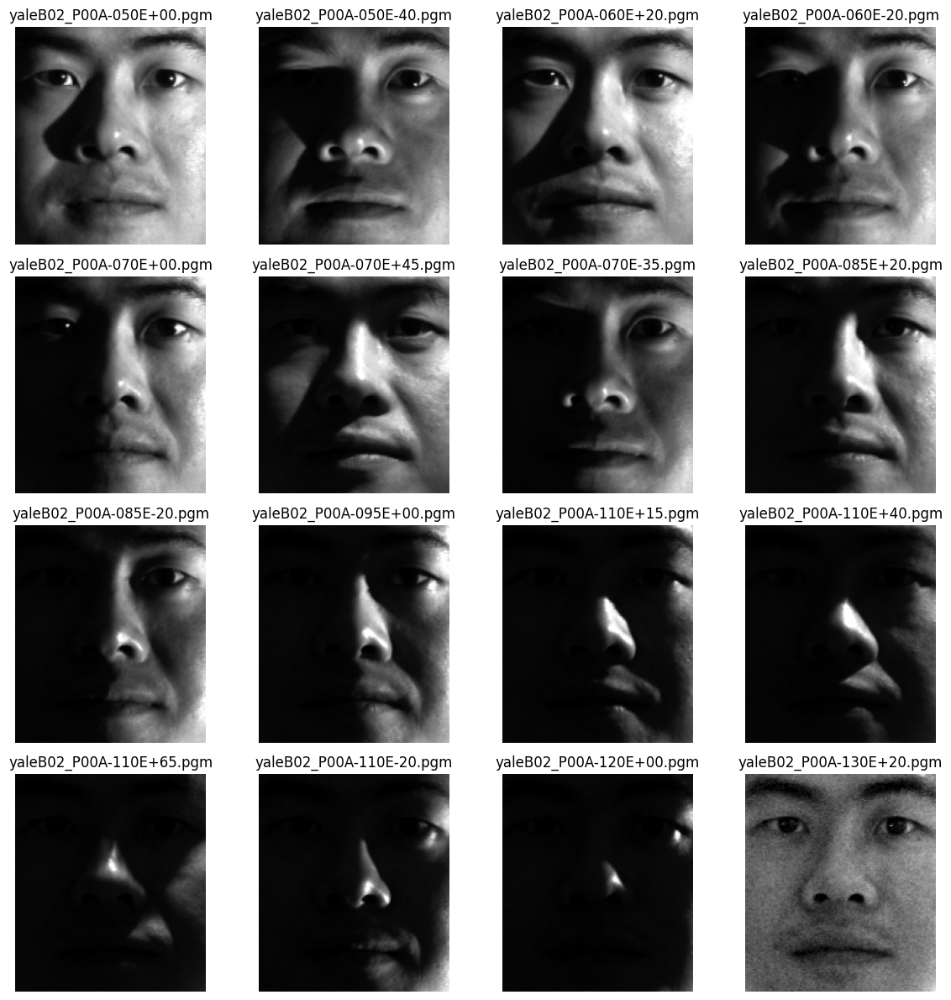

In [45]:
# fn that plots first 16 photos in a 4x4 grid with their filenames as titles
def plot_face_images(image_dir='./photometrics_images/yaleB02/', n=1):
    """
    Plots the first 16 face images from the Yale Face Database in a 4x4 grid, excluding problematic ones.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.
        bad_images: A list of filenames to exclude from the displayed images.
    """

    assert n > 0, "n must be a positive integer."

    # Get all image files in the directory
    image_files = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))

    # Limit to first 16 images
    image_files = image_files[(n-1)*16:n*16]
    assert n/16 <= len(image_files), "n is too large, not enough images in the directory."

    # Create a 4x4 grid for plotting
    fig, axes = plt.subplots(4, 4, figsize=(12, 12))
    axes = axes.flatten()

    for ax, img_file in zip(axes, image_files):
        img = cv2.imread(img_file, -1)
        ax.imshow(img, cmap='gray')
        ax.set_title(os.path.basename(img_file))
        ax.axis('off')

    plt.tight_layout()
    plt.show()

plot_face_images(n=4)

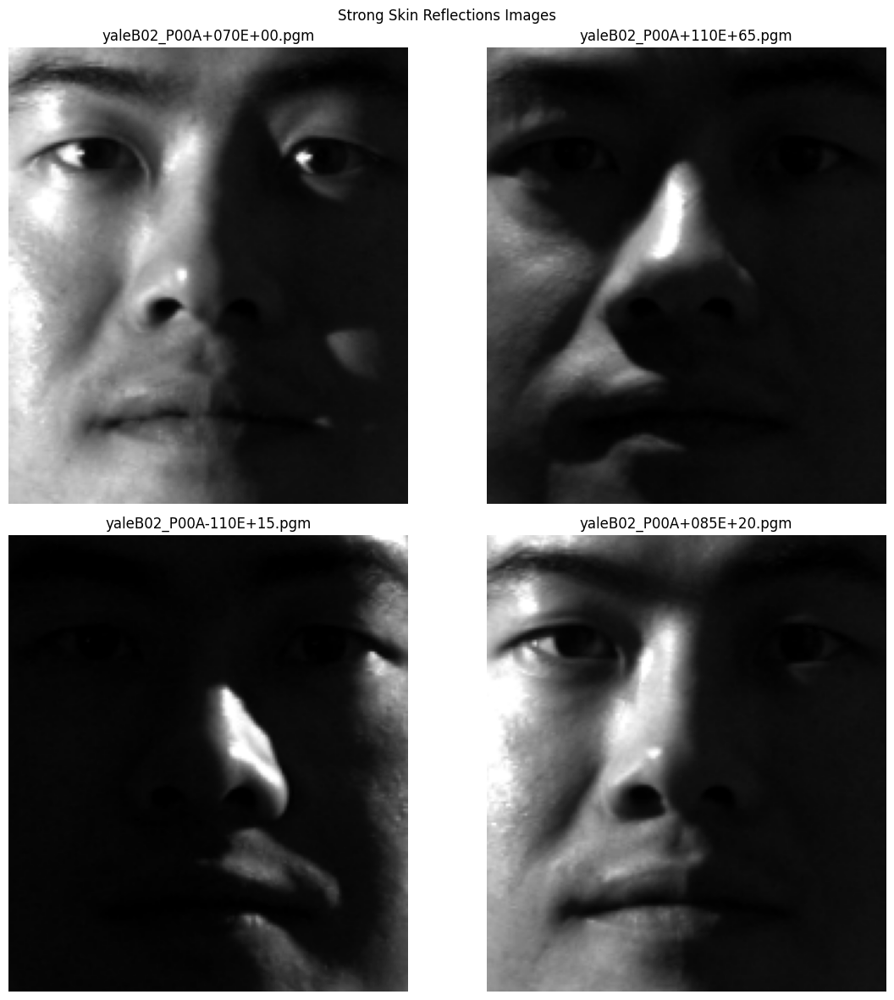

In [46]:
bad_images = [
    # Right Eye Reflectance
    "yaleB02_P00A+070E+00.pgm",

    # Strong Nose Reflectance
    "yaleB02_P00A+110E+65.pgm",
    "yaleB02_P00A-110E+15.pgm",
    "yaleB02_P00A+085E+20.pgm",
]

image_dir='./photometrics_images/yaleB02/'
# Get all image files in the directory
image_files = list(os.path.join(image_dir, img) for img in bad_images)

# Create a 4x4 grid for plotting
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

for ax, img_file in zip(axes, image_files):
    img = cv2.imread(img_file, -1)
    ax.imshow(img, cmap='gray')
    ax.set_title(os.path.basename(img_file))
    ax.axis('off')

fig.suptitle("Strong Skin Reflections Images")
plt.tight_layout()
plt.show()


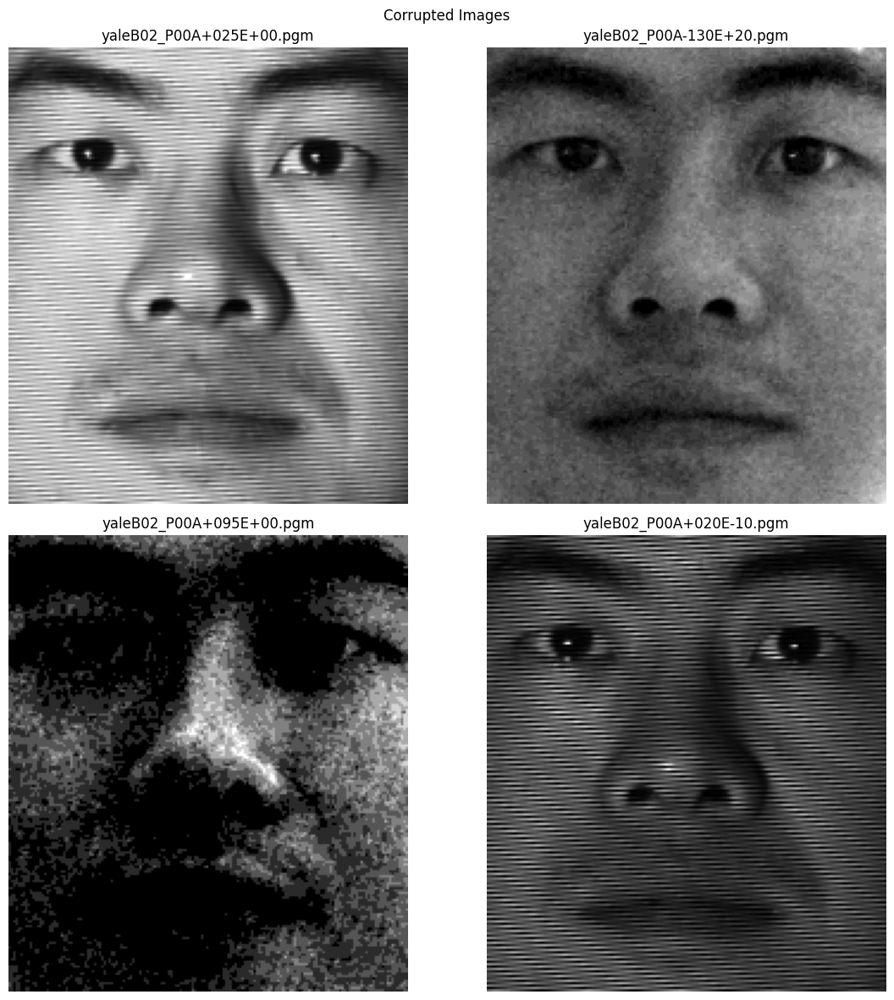

In [47]:
bad_images = [
    "yaleB02_P00A+025E+00.pgm",
    "yaleB02_P00A-130E+20.pgm",
    "yaleB02_P00A+095E+00.pgm",
    "yaleB02_P00A+020E-10.pgm",
]

image_dir='./photometrics_images/yaleB02/'
# Get all image files in the directory
image_files = list(os.path.join(image_dir, img) for img in bad_images)

# Create a 4x4 grid for plotting
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

for ax, img_file in zip(axes, image_files):
    img = cv2.imread(img_file, -1)
    ax.imshow(img, cmap='gray')
    ax.set_title(os.path.basename(img_file))
    ax.axis('off')

fig.suptitle("Corrupted Images")
plt.tight_layout()
plt.show()



> Several assumptions of Lambertian photometric stereo are not fully met:
>
> 1. Corrupted input images – Some images exhibit distortions that clearly violate assumptions. A few contain salt-and-pepper noise, while others have line artifacts caused by poor camera sampling or interpolation. These degraded images negatively affect reconstruction.
>
> 2. Non-Lambertian reflectance – The human skin surface, particularly around the nose and forehead, often shows specular highlights due to oil, sweat, or natural glossiness. These reflections are directional rather than diffuse, violating the Lambertian assumption.
>
> 3. Non-uniform albedo – The assumption of constant albedo is also broken. Eyebrows, facial hair, and eyes have darker tones, and the eyes additionally show camera reflections. This results in albedo variations across the surface that cannot be explained by shading alone.

<a id="question-34"></a>
#### <font color='#FF0000'>Question 34 (2 points)</font>

How would the results improve when the problematic images are removed? Try it out and show the results in your notebook.

To complete this task, you should implement the `load_face_images_filtered` and `photometric_stereo_face_filtered` functions.

In [48]:
def load_face_images_filtered(image_dir='./photometrics_images/yaleB02/', bad_images=[]):
    """
    Loads a set of face images from the Yale Face Database, excluding problematic ones, and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Yale Face images. Defaults to './photometrics_images/yaleB02/'.
        bad_images: A list of filenames to exclude from the image stack.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with the ambient image subtracted, normalized, and problematic images removed.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    
    return load_face_images(image_dir, bad_images)

In [49]:
def photometric_stereo_face_filtered(
    bad_images=[],
    image_dir='./photometrics_images/yaleB02/',
    path_to_original_image=None,
    shadow_trick=False,
    path_type='average',
    threshold=0.0001,
):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Yale Face Dataset, excluding problematic images.

    Args:
        bad_images: A list of filenames to exclude from the image stack (default is an empty list).
        image_dir: Directory containing the input images (default is './photometrics_images/yaleB02/').
        shadow_trick: Whether or not to use the shadow trick for albedo and normal estimation (default is False).
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_face_images_filtered(image_dir, bad_images=bad_images)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=shadow_trick)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    
    p, q, SE = check_integrability(normals)

    
    threshold = threshold

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    print(f"Percentage of outliers: {np.mean(SE > threshold) * 100:.2f}%\n")
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    
    height_map = construct_surface(p, q, path_type=path_type)

    # show results
    print('Displaying results...\n')


    show_results(albedo, normals, original_image_path=path_to_original_image, height_map=height_map, SE=SE, stride=1)

Loading images...

Finish loading 64 images.

Integrability checking

Number of outliers: 13925

Percentage of outliers: 43.17%

Computing surface height map...

Displaying results...



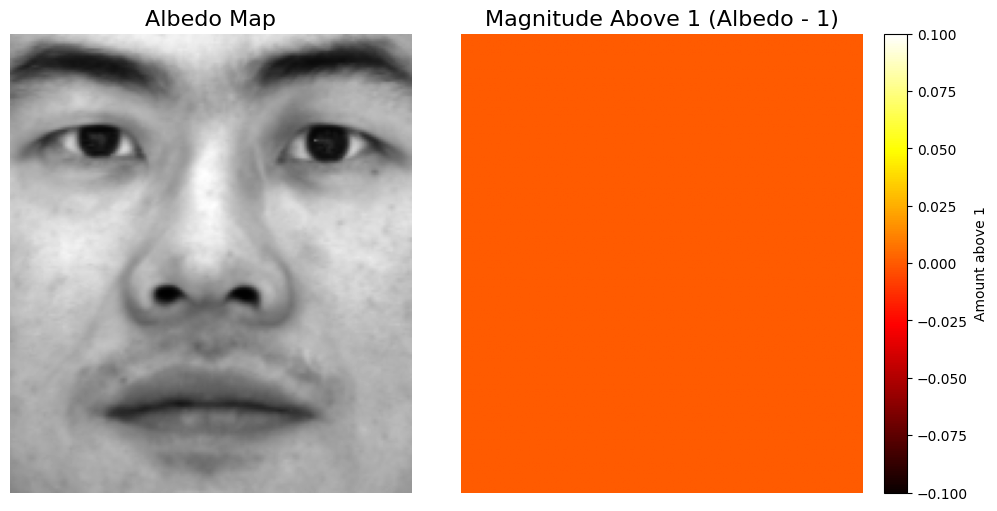

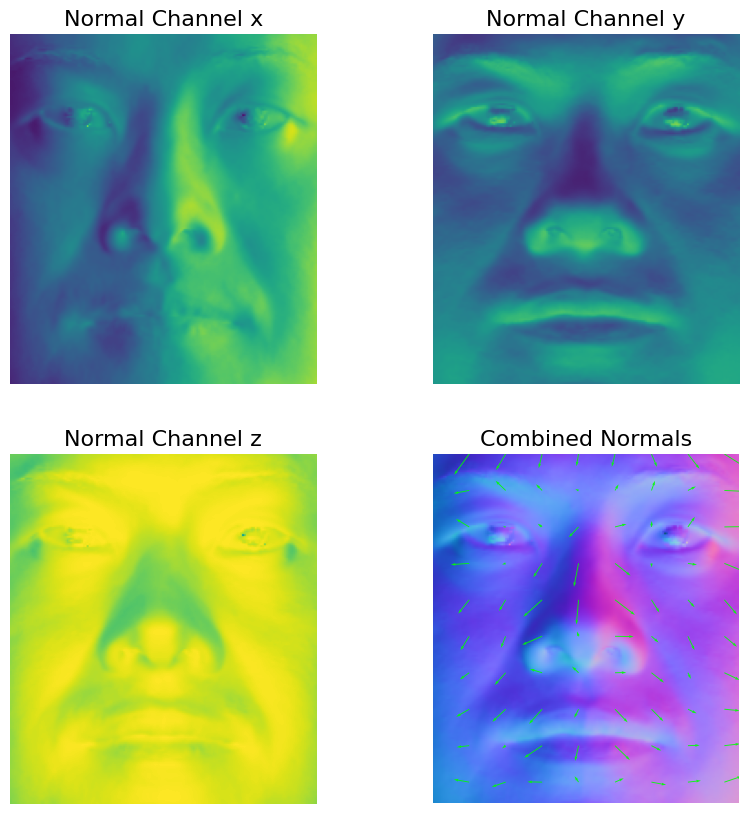

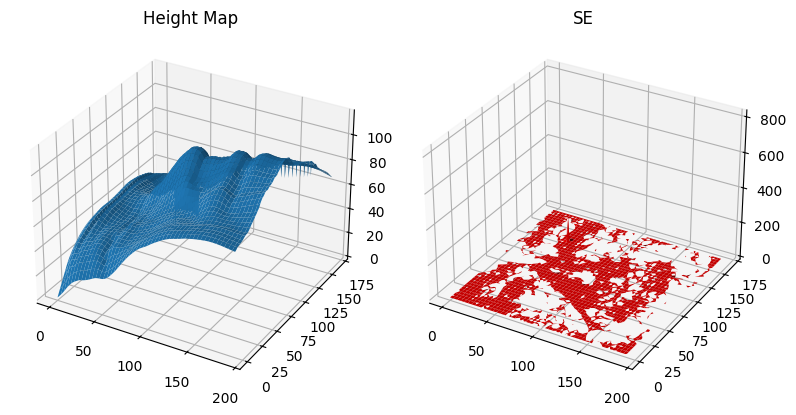

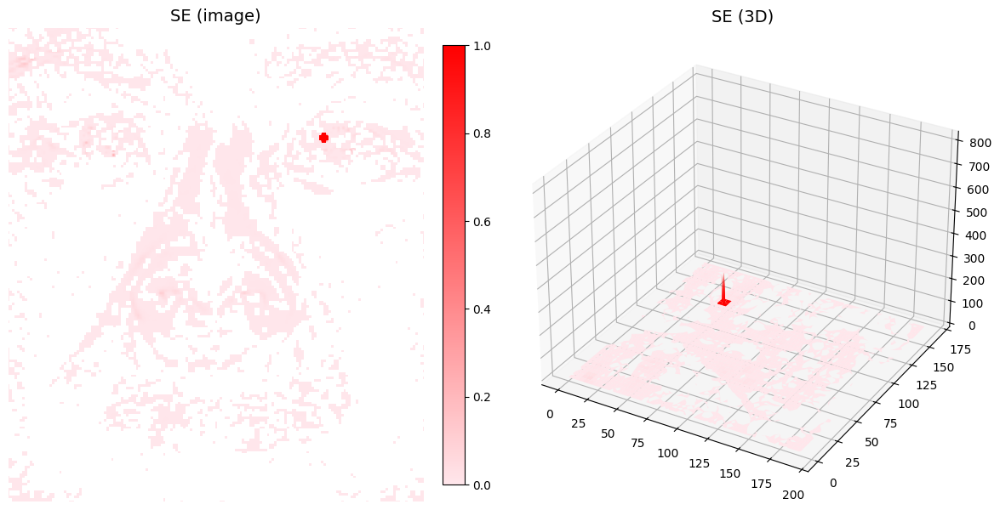

In [50]:
bad_images = [
    "yaleB02_P00A+025E+00.pgm",
    "yaleB02_P00A-130E+20.pgm",
    "yaleB02_P00A+095E+00.pgm",
    "yaleB02_P00A+020E-10.pgm",
]


photometric_stereo_face_filtered(
    bad_images=bad_images,
    shadow_trick=False,
    path_type='average',
)

<a id="question-35"></a>
#### <font color='#FF0000'>Question 35 (1 point)</font>

Discuss the results obtained after removing the problematic images. What are the differences in the results, and how do they compare to the original results?

##### <font color='yellow'>Answer:</font>

> The squared errors are much lower now. We managed to decrease the percentage of error pixels from 56% to 43%. We did this by only removing corrupted images. Initially we considered images that were mostly dark or that showed significant reflectance on the right eye and nose, but their contributions to lower the squared error where not significant. Despite this, the squared error located in the right eye diminished significantly than when not filtering any picture.

<a id="question-36"></a>
#### <font color='#FF0000'>Question 36 (4 points)</font>

Now, it's time to apply the algorithm to the Apple dataset using real-world 3-channel RGB inputs.

For the Apple dataset, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface height
- Show the results

Use the images in the "Apple" folder. The `load_apple_images` function is provided as a helper. You should complete the `photometric_stereo_apple_dataset` function as part of this task.

Observe and discuss the results for different integration paths. You may encounter difficulties using this non-synthetic dataset—try if filtering may help.

Make sure to display the results using the 3 paths (column-major, row-major, and average) when constructing the surface height map.

In [51]:
def load_apple_images(image_dir='./photometrics_images/Apple'):
    """
    Loads a set of apple images from the Apple dataset and computes corresponding light directions.

    Args:
        image_dir: The directory containing the Apple images. Defaults to './photometrics_images/Apple/'.

    Returns:
        A tuple containing:
            - image_stack: A stack of images with only the red channel extracted and normalized.
            - scriptV: An array of light direction vectors corresponding to each image.
    """

    # define the number of images to load
    num_images = 99
    
    # load a sample image to determine its dimensions
    filename = os.path.join(image_dir, 'I_0000.png')
    try_image = cv2.imread(filename, -1)
    
    # get the height and width of the sample image
    h, w = try_image[:,:,0].shape

    # import glob to find all image files in the directory
    import glob
    
    # get a list of all image files that match the pattern for the Apple dataset
    d = glob.glob(os.path.join(image_dir, 'I_00*.png'))
    
    # randomly select a subset of images to match the num_images count
    import random
    d = random.sample(d, num_images)
    
    # extract the base filenames from the list of image paths and their corresponding indices
    filenames = [os.path.basename(x) for x in d]
    filenames_idx = [int(i.split('_')[1].split('.')[0]) for i in filenames]

    # initialize arrays for storing angles and image data
    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    # loop through each selected image file
    for j in range(num_images):
        # load the image and extract the red channel (index 2)
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1)[:,:,2]

    # read light direction vectors from the provided file
    with open('./photometrics_images/Apple/light_directions_refined.txt') as file:
        lines = [line.split() for line in file]
        x, y, z = [], [], []
        
        # extract light directions corresponding to the selected images
        for idx in filenames_idx:
            x.append(float(lines[idx][0]))
            y.append(float(lines[idx][1]))
            z.append(float(lines[idx][2]))

    # combine the direction vectors, adjusting for normal direction
    scriptV = [1,-1,1] * np.array([x,y,z]).transpose(1,0)

    # convert the image stack to double precision
    image_stack = np.double(image_stack)
    
    # set any negative pixel values to 0 (removing underflow)
    image_stack[image_stack < 0] = 0
    
    # find the minimum and maximum pixel values in the image stack
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    
    # normalize the image stack to have values between 0 and 1, or set to zeros if min and max are equal
    if max_val != min_val:
        image_stack = (image_stack - min_val) / (max_val - min_val)
    else:
        image_stack = np.zeros(image_stack.shape)  # avoid failure when all pixel values are the same

    # return the processed image stack and light directions
    return image_stack, scriptV

In [52]:
def photometric_stereo_apple_dataset(
    image_dir='./photometrics_images/Apple/',
    path_to_original_image='./photometrics_images/Apple/I_0030.png',
    path_type='average',
    shadow_trick=False,
    threshold=0.0001,
    suffix="",
    plotting_fn=None,
):
    """
    Performs photometric stereo to estimate the surface albedo, normals, and height map for the Apple Dataset under varying illumination conditions.

    Args:
        image_dir: Directory containing the input images (default is './photometrics_images/Apple/').
        path_type: Type of path integration to use for surface height computation (default is 'average').

    Returns:
        None
    """

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_apple_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')
    
    albedo, normals = estimate_albedo_and_normals(image_stack, scriptV, shadow_trick=shadow_trick)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')

    
    p, q, SE = check_integrability(normals)

    
    threshold = 0.005

    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan')  # for good visualization

    # compute the surface height map
    print('Computing surface height map...\n')

    
    height_map = construct_surface(p, q, path_type=path_type)

    # show results
    print('Displaying results...\n')

    
    if plotting_fn is not None:
        plotting_fn(albedo=albedo, normals=normals, suffix=suffix, original_image_path=path_to_original_image, height_map=height_map, SE=SE, stride=1)
    else:
        show_results(albedo, normals, suffix=suffix, original_image_path=path_to_original_image, height_map=height_map, SE=SE, stride=1)

If you estimate the albedo and surface normal using the three path types, the cell below will run for at least 1 minute.

Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 5731

Computing surface height map...

Displaying results...



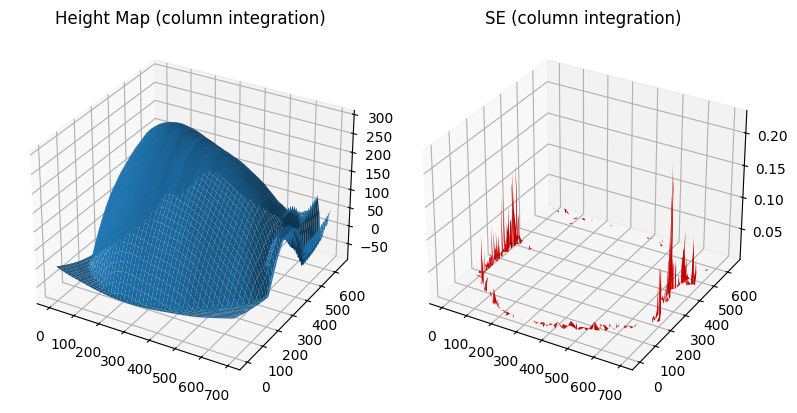

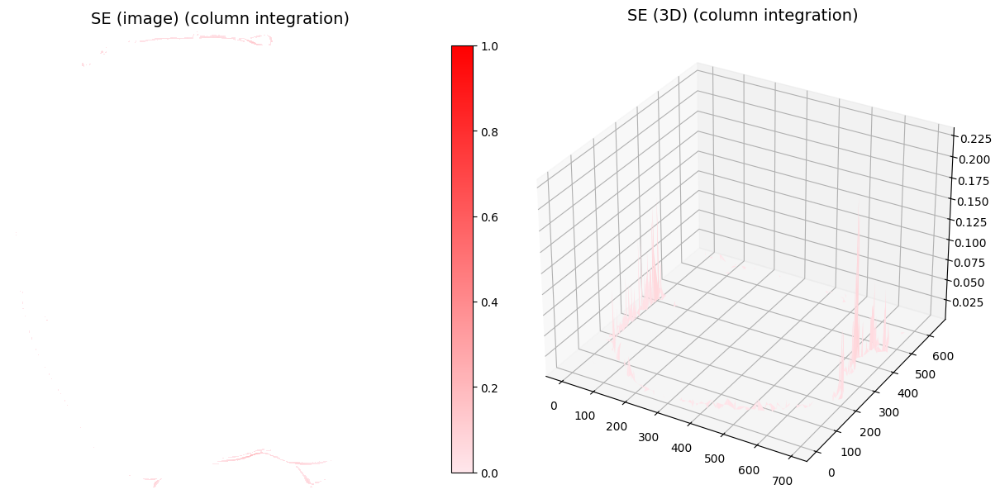

Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 5731

Computing surface height map...

Displaying results...



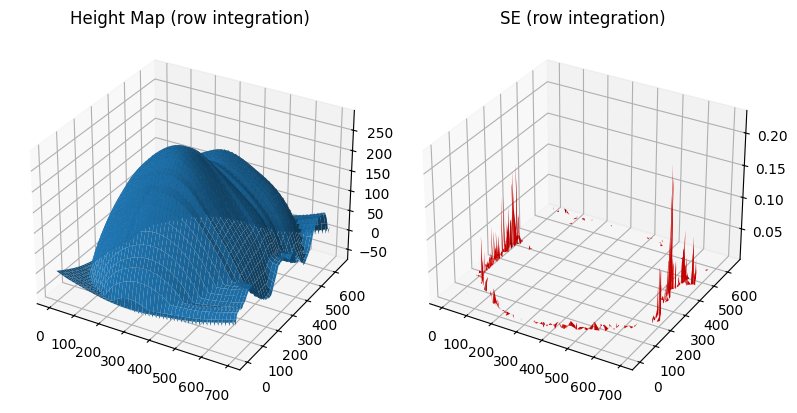

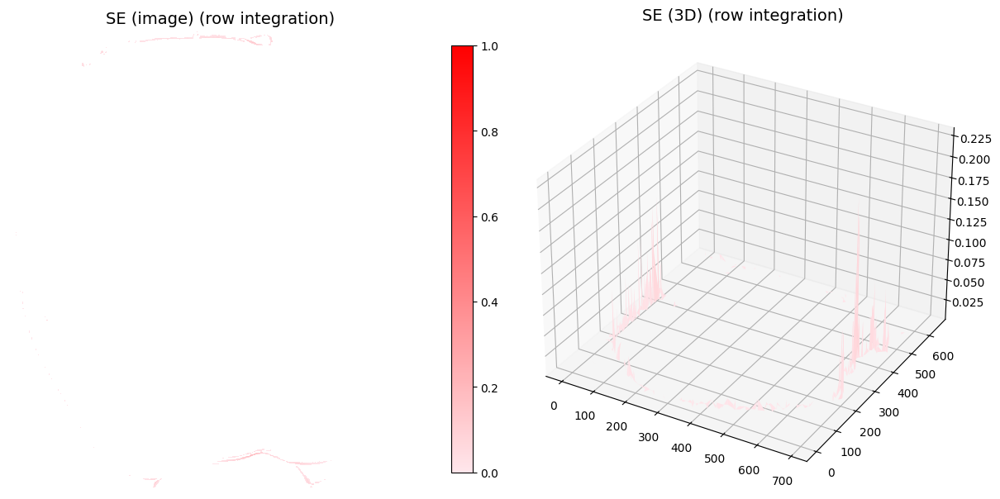

Loading images...

Finish loading 99 images.

Computing surface albedo and normal map...

Integrability checking

Number of outliers: 5731

Computing surface height map...

Displaying results...



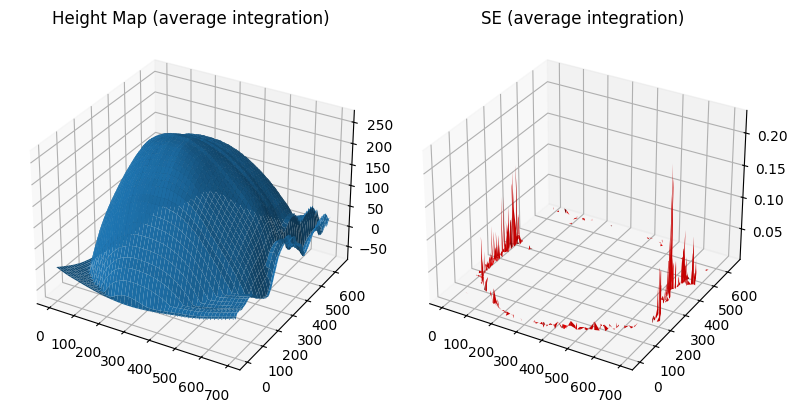

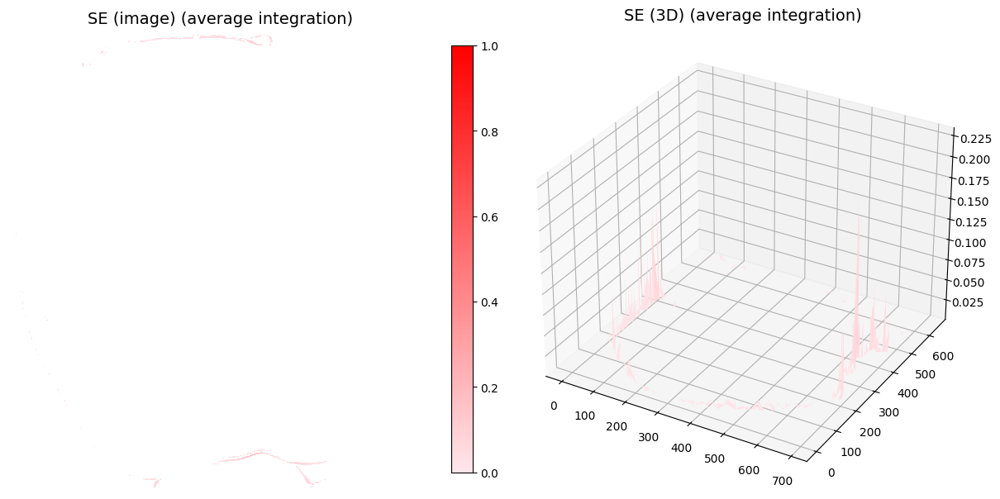

In [53]:

photometric_stereo_apple_dataset(path_type='column', plotting_fn=plot_height_map, suffix="(column integration)")

photometric_stereo_apple_dataset(path_type='row', plotting_fn=plot_height_map, suffix="(row integration)")

photometric_stereo_apple_dataset(path_type='average', plotting_fn=plot_height_map, suffix="(average integration)")



<a id="question-37"></a>
#### <font color='#FF0000'>Question 37 (1 point)</font>

Observe and discuss the results for different integration paths in the `photometric_stereo_apple_dataset` function.

##### <font color='yellow'>Answer:</font>

> We observe a the same behavior as with the face dataset. The column and row majors capture granular details in individual directions, hence, we do not see the nuance of the "cheeks" of the apple in the column major, but we do on the row major. Finally, the average path evens out both perspectives, offering a smoother, more accurate surface. 

<a id="section-x"></a>
### **Section X: Individual Contribution Report *(Mandatory)***

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.

| Name | Contribution on Research | Contribution on Programming | Contribution on Writing |
| -------- | ------- | ------- | ------- |
|  Daniel Otero | 33 % | 33 % | 33 % |
|  Miguel Mendes | 33 % | 33 % | 33 % |
|  Daniel Amidirad | 33 % | 33 % | 33 % |


In case the table disappears we all contributed the same amount at each part of the project. We divided the exercises so that everyone did roughly the same amount of work.

### - End of Notebook -